In [1]:
import numpy as np
import healpy as hp

import matplotlib
from matplotlib import pyplot as plt

from scipy import stats
import matplotlib.gridspec as gridspec
import astropy.cosmology.units as cu
import astropy.units as u
import site
site.addsitedir('/oak/stanford/orgs/kipac/users/mahlet/quaia_bias/scripts') 
import quaia
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
import pyccl as ccl
from matplotlib.lines import Line2D
from matplotlib import cm
from scipy.optimize import minimize
from astropy.cosmology import Planck18
from dynesty import NestedSampler
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from astropy.coordinates import SkyCoord
from healpy.newvisufunc import projview
from scipy import special

In [2]:
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['legend.fontsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 20

# Model using step-function HOD
## Define parameters

In [3]:
G_hi = 20.5

In [4]:
nthreads = 18

In [5]:
z_bins = np.array([0.0, 1.0, 2.0, 3.0, 4.6])
z_array = range(len(z_bins)-1)
mask = 0.5

In [6]:
cosmo_planck18 = ccl.Cosmology(Omega_c=0.265, Omega_b=Planck18.Ob0, h=Planck18.h, Neff = Planck18.Neff, T_CMB = Planck18.Tcmb0.value, m_nu = Planck18.m_nu, sigma8=0.8, n_s=0.95)

In [7]:
Delta = 200
delta_c = 1.686

In [8]:
hmf = ccl.halos.MassFuncTinker10()

In [9]:
NSIDE = 64

In [10]:
M_max = 15

## Define functions

In [11]:
def a_median(tab_datahi_mask_zbin0, key_zbin0 = ''):
    return 1/(1+np.median(tab_datahi_mask_zbin0['redshift_quaia'+key_zbin0]))

In [12]:
def b_qso(xi_qq, xi_mm, f):
    
    return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3

In [13]:
def nu(M, delta_c = delta_c, a = 1, cosmo = cosmo_planck18):
    
    sigma = cosmo.sigmaM(M, a = a)
   
    return delta_c/sigma

In [14]:
def n_g_theory(bins, n_total, a = 1, cosmo = cosmo_planck18, hmf = hmf, recenter = True):

    if recenter == True:
        bins = quaia.recenter(bins)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3
    n_g = nm/(bins*np.log(10))*n_total
    n_g[np.isnan(n_g)]=0
    
    return n_g, nm

def bias(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter)
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
    n_g = np.trapz(n_g, bins)
    dn_dm = nm/(bins*np.log(10))

    b1_E_tinker = b1_E_func(nu(bins, a = a, cosmo = cosmo), mod = mod)

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    return bias_function(n_g, integrand, b1_E_tinker, bins, recenter = recenter), n_g

In [15]:
def b1_E_func(nu, Delta = Delta, delta_c = delta_c, mod = False):

    delta_c = 1.686
    
    if mod == False:
        y = np.log10(Delta)
        A =  1.0+0.24*y*np.exp(-(4/y)**4)
        a = 0.44*y-0.88
        B = 0.183
        b =  1.5
        C = 0.019+0.107*y+0.19*np.exp(-(4/y)**4)
        c = 2.4
        
    else:
        A =  1.0
        a = 0.0906
        B = -4.5002
        b =  2.1419
        C = 4.9148
        c = 2.1419
        
    return 1-A*nu**a/(nu**a+delta_c**a)+B*nu**b+C*nu**c # Jose et al
    
def bias_function(n_g, integrand, b, bins, recenter = True):
    
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
        
    return 1/n_g*np.trapz(integrand*b, bins)

In [16]:
def cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = True):
    
    b_q, n_g = bias(bins, n_m, a, cosmo, recenter = recenter)
    return b_q**2*cf_matter, b_q

In [17]:
def M(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True, hmf = hmf):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter, hmf = hmf)
    if recenter == True:
        n_g = np.trapz(n_g, quaia.recenter(bins))
        dm = np.diff(bins) 
        dn_dm = nm/(quaia.recenter(bins)*np.log(10))
    else:
        n_g = np.trapz(n_g, bins)
        dn_dm = nm/(bins*np.log(10))

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    if recenter == True:
        return bias_function(n_g, integrand, quaia.recenter(bins), bins, recenter = recenter), n_g
    else:
        return bias_function(n_g, integrand, bins, bins, recenter = recenter), n_g

In [18]:
def HOD(bins, M_min, fduty):

    n_m=np.zeros(np.shape(quaia.recenter(bins)))
    n_m[quaia.recenter(bins)>=M_min]=fduty

    return n_m

In [19]:
def n_DM(cosmo, a, M_min, hmf = hmf, M_max = M_max, N = 79): #16.8
    
    bins = np.logspace(M_min, M_max, N)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3 #/u.Mpc**3 # convert to h/Mpc**3
    dn_dm = nm/(bins*np.log(10))
    
    return np.trapz(dn_dm, bins)

# Implement halo model
## Plot HOD: $\langle N\left(M\right)\rangle=\frac{f_{\text {duty }}}{2} \operatorname{erfc}\left[\frac{\ln (M_\mathrm{min} / M)}{\sqrt{2} \sigma}\right]$
### At fixed $f_{duty}$ and $M_{min}$

In [20]:
bins = np.logspace(9, M_max, 79)

In [23]:
M_min_array = [11.94, 11.98, 11.97, 12.07]

In [106]:
fduty = [0.002, 0.002, 0.003, 0.002]
    
# def HOD_scatter(i, M, sigma, fduty = fduty, M_min_array = M_min_array):
    
#     return fduty[i]/2*special.erfc(np.log(10**M_min_array[i]/M)/(np.sqrt(2)*sigma))

def HOD_scatter(fduty, M_min, M, sigma):
    
    return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*sigma))

In [90]:
cmap_blue = plt.get_cmap('Blues')(np.linspace(0.333, 0.999, len(z_array)))

<>:18: SyntaxWarning: invalid escape sequence '\l'
<>:27: SyntaxWarning: invalid escape sequence '\o'
<>:34: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\l'
<>:27: SyntaxWarning: invalid escape sequence '\o'
<>:34: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_251151/3378215554.py:18: SyntaxWarning: invalid escape sequence '\l'
  ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
/tmp/ipykernel_251151/3378215554.py:27: SyntaxWarning: invalid escape sequence '\o'
  ax1.set_xlabel('$M (M_\odot)$')
/tmp/ipykernel_251151/3378215554.py:34: SyntaxWarning: invalid escape sequence '\s'
  ax1.set_title('$\sigma={}$'.format(sigma[j]))
/tmp/ipykernel_251151/4234114322.py:9: RuntimeWarning: divide by zero encountered in divide
  return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*sigma))
/tmp/ipykernel_251151/4234114322.py:9: RuntimeWarning: invalid value encountered in div

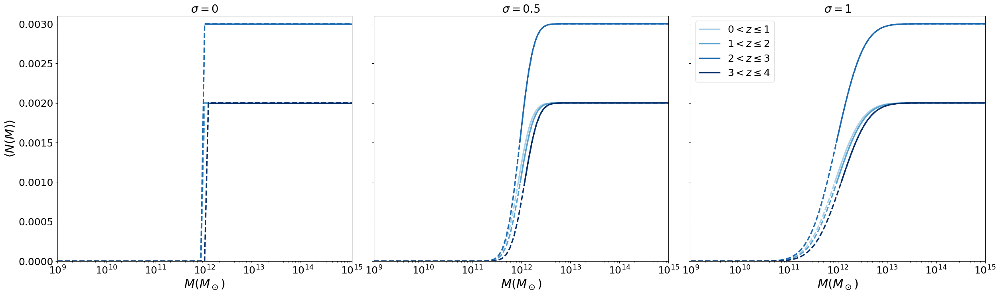

In [109]:
fig = plt.figure(figsize = (30, 8))
gs = gridspec.GridSpec(1, 3, wspace = 0.075)
sigma = [0, 0.5, 1]
n_m_array, bins_M_min = [], []

for j in range(len(sigma)):
    
    ax1 = fig.add_subplot(gs[j])
        
    for i in z_array:
        
        bins_i = np.logspace(M_min_array[i], M_max, 79)

        # ax1.plot(bins_i, HOD_scatter(i, bins_i, sigma=sigma[j]), linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
        # ax1.plot(bins, HOD_scatter(i, bins, sigma=sigma[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])

        n_m = HOD_scatter(fduty[i], M_min_array[i], bins_i, sigma[j])
        ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
        ax1.plot(bins, HOD_scatter(fduty[i], M_min_array[i], bins, sigma[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])

        if j == 0:
            
            n_m_array.append(n_m)
            bins_M_min.append(bins_i)
    
    ax1.set_xscale('log')
    ax1.set_xlabel('$M (M_\odot)$')
    
    if j== 0:
        ax1.set_ylabel(r'$\langle N(M) \rangle$')
    else:
        ax1.set_yticklabels([])
    
    ax1.set_title('$\sigma={}$'.format(sigma[j]))
    ax1.set_xlim(1e9,10**M_max)
    ax1.set_ylim(0, 0.0031)
    
ax1.legend()
plt.show()

## Calculate $b_{\mathrm{qq}}(s,z)=\sqrt{\frac{\xi^{(s)}_{\mathrm{qq}}(s)}{\xi^{(r)}_\mathrm{mm}(r)}-\frac{4 \Omega_{\mathrm{m}}^{1.2}(z)}{45}}-\frac{\Omega_{\mathrm{m}}^{0.6}(z)}{3}$
### Use a 50th percentile mask

In [110]:
bins_M_min_array = [np.logspace(np.log10(bins[j]), M_max, 79) for j in range(len(bins))]

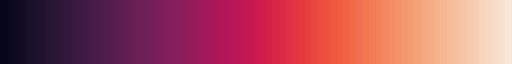

In [111]:
cmap = sns.color_palette("rocket", n_colors = len(bins))
palette = matplotlib.colors.ListedColormap(cmap)
palette

# Calculate derived parameters
## Plot b(z)

In [112]:
def b_eboss(z):
    
    return 0.278*((1+z)**2-6.565) + 2.393

def b_quaia(b_0, a, cosmo = cosmo_planck18): #quaia):
    
    return b_0/ccl.growth_factor(cosmo, a)

In [113]:
b_cf20 = np.load('../results/b_cf20_planck18.npy')
b_wp20 = np.load('../results/b_wp20_planck18.npy')

# Calculate number density as $n_q \approx \int_0^{\infty} d M \frac{d n}{d M}\langle N(M)\rangle$

In [114]:
tab_datahi_mask_zbins, selfunc_hi_bins = [], []
for j in z_array:
    
    tab_datahi_mask_zbin0, _, _, _, _, _, selfunc_hi_bin0, _, pixel_indices_datahi_bin0 = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)
    tab_datahi_mask_zbins.append(tab_datahi_mask_zbin0['redshift_quaia'])
    selfunc_hi_bins.append(selfunc_hi_bin0)

Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              223881 vs 324336
Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464213 vs 648196
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              213734 vs 286508
Pixels masked by MC but not already by selfunc: 350
G20.5_zmin3.0zmax4.6: 0.22              28436 vs 36458


In [115]:
n_q, n_q_err, V_eff, N_q = [], [], [], []

for j in z_array:
    
    N = len(tab_datahi_mask_zbins[j])
    cp = np.percentile(selfunc_hi_bins[j], mask*100)
    f_sky = 1/(4*np.pi)*np.sum(selfunc_hi_bins[j][selfunc_hi_bins[j]>=cp]*hp.nside2pixarea(NSIDE))
    print(f_sky) # f_sky)
    V = f_sky*(Planck18.comoving_volume(z_bins[j+1])-Planck18.comoving_volume(z_bins[j]))*Planck18.h**3/u.h**3
    N_q.append(N)
    n_q.append(N/V.value)
    n_q_err.append(np.sqrt(N)/V.value) # Poisson error
    V_eff.append(V)
    
n_q

0.3845560073799039
0.40216201738111934
0.4302131627396445
0.4406662053921837


[1.1460676322037898e-05,
 8.057535346050653e-06,
 3.0495647269572566e-06,
 2.688727754331005e-07]

## Limit scales to $30\geq s \geq 80h^{-1}$ Mpc

In [117]:
# Create the bins array
offset = 2.5
delta_max = 40# 64
delta_min = np.min((np.floor((30-0.15)/offset), delta_max))

rmin = 30-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax = 80+delta_max*offset # 200
nbins = 20 + int(delta_min+delta_max) #90 #20
rbins_chi2 = np.linspace(rmin, rmax, nbins + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
scale = 'linear'
rbins_chi2, quaia.recenter(rbins_chi2), np.diff(quaia.recenter(rbins_chi2))

(array([  2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ,  22.5,
         25. ,  27.5,  30. ,  32.5,  35. ,  37.5,  40. ,  42.5,  45. ,
         47.5,  50. ,  52.5,  55. ,  57.5,  60. ,  62.5,  65. ,  67.5,
         70. ,  72.5,  75. ,  77.5,  80. ,  82.5,  85. ,  87.5,  90. ,
         92.5,  95. ,  97.5, 100. , 102.5, 105. , 107.5, 110. , 112.5,
        115. , 117.5, 120. , 122.5, 125. , 127.5, 130. , 132.5, 135. ,
        137.5, 140. , 142.5, 145. , 147.5, 150. , 152.5, 155. , 157.5,
        160. , 162.5, 165. , 167.5, 170. , 172.5, 175. , 177.5, 180. ]),
 array([  3.75,   6.25,   8.75,  11.25,  13.75,  16.25,  18.75,  21.25,
         23.75,  26.25,  28.75,  31.25,  33.75,  36.25,  38.75,  41.25,
         43.75,  46.25,  48.75,  51.25,  53.75,  56.25,  58.75,  61.25,
         63.75,  66.25,  68.75,  71.25,  73.75,  76.25,  78.75,  81.25,
         83.75,  86.25,  88.75,  91.25,  93.75,  96.25,  98.75, 101.25,
        103.75, 106.25, 108.75, 111.25, 113.75, 116.25, 118.75, 121.25

## Compute the maximum number of jackknife regions

In [119]:
for j in z_array:
    
    N = len(tab_datahi_mask_zbins[j])
    cp = np.percentile(selfunc_hi_bins[j], mask*100)
    f_sky = 1/(4*np.pi)*np.sum(selfunc_hi_bins[j][selfunc_hi_bins[j]>=cp]*hp.nside2pixarea(NSIDE))
    V = f_sky*(Planck18.comoving_volume(j+1)-Planck18.comoving_volume(j))*Planck18.h**3/u.h**3
    V_jackknife = f_sky*(4/3*np.pi*(rmax**3))*V.unit
    print(np.int(V/V_jackknife), (V/25)**(1/3))

2079 921.0622735474994 Mpc / h
5864 1320.8647698576522 Mpc / h
6668 1410.0415698632053 Mpc / h
6319 1396.1231500750716 Mpc / h


In [120]:
cf_chi2, cf_matter_chi2 = [], []
yerr_cf_chi2, b_cf_chi2 = [], []
b_cf_q_chi2 = []
a_zbin = []
H0 = Planck18.H0 # cosmo_planck18['H0'] * u.km/u.s/u.Mpc
    
for j in z_array:

    tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)

    # quasar correlation function
    cf, qq, qr = quaia.xi_s(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
               rbins = rbins_chi2, Om0 = Planck18.Om0, h = Planck18.h, error = True)
    cf_chi2.append(cf)

    # scale factor
    a = a_median(tab_datahi_mask_zbin0)
    a_zbin.append(a)

    # matter correlation function
    rbins_Mpc = (quaia.recenter(rbins_chi2)*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))
    cf_matter = ccl.correlations.correlation_3d(cosmo_planck18, r=rbins_Mpc, a=a)
    cf_matter_chi2.append(cf_matter)

    # effective bias 
    b = np.sqrt(cf/cf_matter)
    b_cf_chi2.append(b)

    # yerr
    yerr=(1+cf)/np.sqrt(qq)
    yerr[cf<0]=np.sqrt((1+b**2*cf_matter)/qr)[cf<0] #https://arxiv.org/abs/1603.04849
    yerr_cf_chi2.append(yerr)

    # qso bias
    b_cf_q_chi2.append(b_qso(cf, cf_matter, ccl.growth_rate(cosmo_planck18, a)))

Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              223881 vs 324336


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_251151/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_251151/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464213 vs 648196


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_251151/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_251151/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              213734 vs 286508


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_251151/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_251151/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


Pixels masked by MC but not already by selfunc: 350
G20.5_zmin3.0zmax4.6: 0.22              28436 vs 36458


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_251151/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_251151/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


In [121]:
rpmask = (quaia.recenter(rbins_chi2) >= 30) & (quaia.recenter(rbins_chi2) <= 80)

# Perform nested sampling with dynesty

In [116]:
j = 2
tab_datahi_mask_zbin0, _, _, _, _, _, selfunc_hi_bin0, _, _ = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)

Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              213734 vs 286508


In [32]:
NPIX = hp.nside2npix(NSIDE)

In [33]:
fac_stdev = 0.7

In [34]:
name_catalog = '$Gaia$-$unWISE$ Quasar Catalog'

In [35]:
N_gcatlo_mask = len(tab_datahi_mask_zbin0)

In [36]:
cmap_map = 'plasma'
cbar_ticks = [5, 10, 20]

In [37]:
pixel_indices_datahi_bin0 = hp.ang2pix(NSIDE, tab_datahi_mask_zbin0['ra'], tab_datahi_mask_zbin0['dec'], lonlat=True)

0.9487440461546406 7.874009860095359


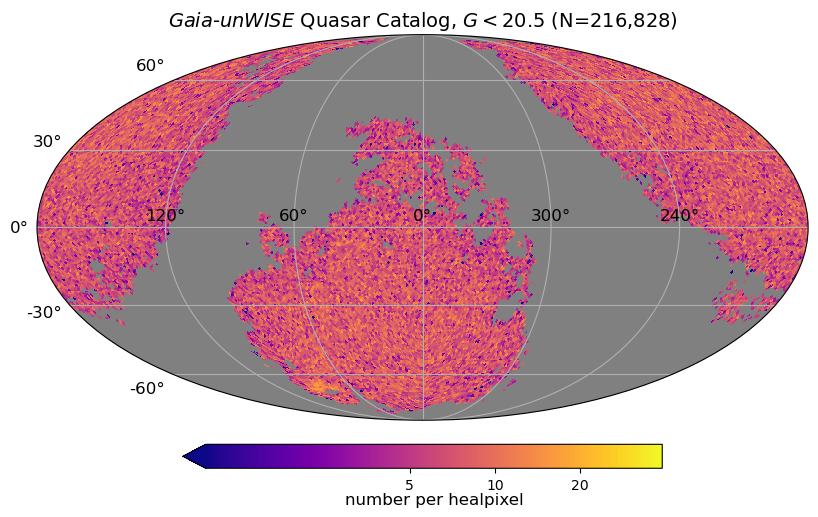

In [38]:
map_gcatlo = np.bincount(pixel_indices_datahi_bin0, minlength=NPIX)
print(np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), np.mean(map_gcatlo)+fac_stdev*np.std(map_gcatlo))
title_gcatlo = rf"{name_catalog}, $G<{G_hi}$ (N={N_gcatlo_mask:,})"
projview(map_gcatlo*hp.pixelfunc.nside2pixarea(NSIDE, degrees = True), title=title_gcatlo,
            unit=r"number per healpixel", cmap=cmap_map, coord=['C'], #, 'G']
            min=np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), max=np.mean(map_gcatlo)+10*fac_stdev*np.std(map_gcatlo), 
            norm='log', graticule=True, cbar_ticks=cbar_ticks, graticule_labels=True)

In [39]:
LMC = SkyCoord(['05 23 34.6 -69 45 22'], unit=(u.hourangle, u.deg)) #https://simbad.u-strasbg.fr/simbad/sim-id?Ident=Large+Magellanic+Cloud

In [40]:
LMC_radius = 9*u.deg

In [41]:
SMC = SkyCoord(['00 52 38.0 -72 48 01'], unit=(u.hourangle, u.deg)) # https://simbad.u-strasbg.fr/simbad/sim-id?Ident=small+Magellanic+Cloud

In [42]:
SMC_radius = 5*u.deg

In [43]:
c = SkyCoord(ra=tab_datahi_mask_zbin0['ra'].value*u.degree, dec=tab_datahi_mask_zbin0['dec'].value*u.degree)
LMC_idx, _, _, _ = SkyCoord.search_around_sky(LMC, c, LMC_radius)

In [44]:
SMC_idx, _, _, _ = SkyCoord.search_around_sky(SMC, c, SMC_radius)

In [45]:
MC_idx = np.append(LMC_idx,SMC_idx)

In [46]:
MC_mask = np.full_like(selfunc_hi_bin0, True, dtype = bool)
MC_mask[pixel_indices_datahi_bin0[MC_idx]] = False

In [47]:
selfunc_hi_bin0_norm = selfunc_hi_bin0/np.max(selfunc_hi_bin0[MC_mask])

In [48]:
selfunc_hi_bin0_norm_mask = selfunc_hi_bin0_norm[MC_mask]

In [49]:
np.max(selfunc_hi_bin0_norm[pixel_indices_datahi_bin0[MC_idx]])

0.0

In [50]:
selfunc_hi_bin0_MC = np.copy(selfunc_hi_bin0_norm)
selfunc_hi_bin0_MC[pixel_indices_datahi_bin0[MC_idx]] = 0

In [51]:
selfunc_hi_bin0_MC[pixel_indices_datahi_bin0[MC_idx]]

array([0., 0., 0., ..., 0., 0., 0.])

0.020606507766140585 0.10528867452552607


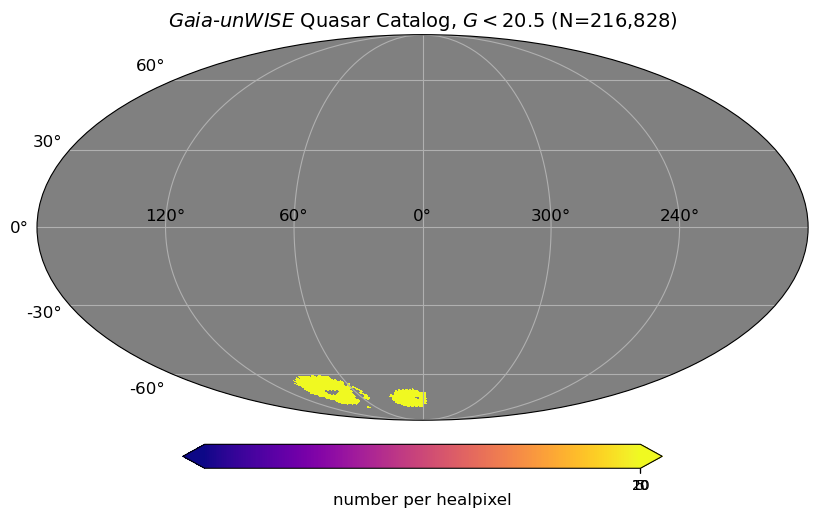

In [52]:
fac_stdev = 0.05
map_gcatlo = np.bincount(pixel_indices_datahi_bin0[MC_idx], minlength=NPIX)
print(np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), np.mean(map_gcatlo)+fac_stdev*np.std(map_gcatlo))
title_gcatlo = rf"{name_catalog}, $G<{G_hi}$ (N={N_gcatlo_mask:,})"
projview(map_gcatlo*hp.pixelfunc.nside2pixarea(NSIDE, degrees = True), title=title_gcatlo,
            unit=r"number per healpixel", cmap=cmap_map, coord=['C'], 
            min=np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), max=np.mean(map_gcatlo)+10*fac_stdev*np.std(map_gcatlo), 
            norm='log', graticule=True, cbar_ticks=cbar_ticks, graticule_labels=True)

In [53]:
pixel_indices_datahi_bin0_mask = np.full_like(pixel_indices_datahi_bin0, True, dtype = bool)
pixel_indices_datahi_bin0_mask[MC_idx] = False

0.16177501908387448 8.53508370487446


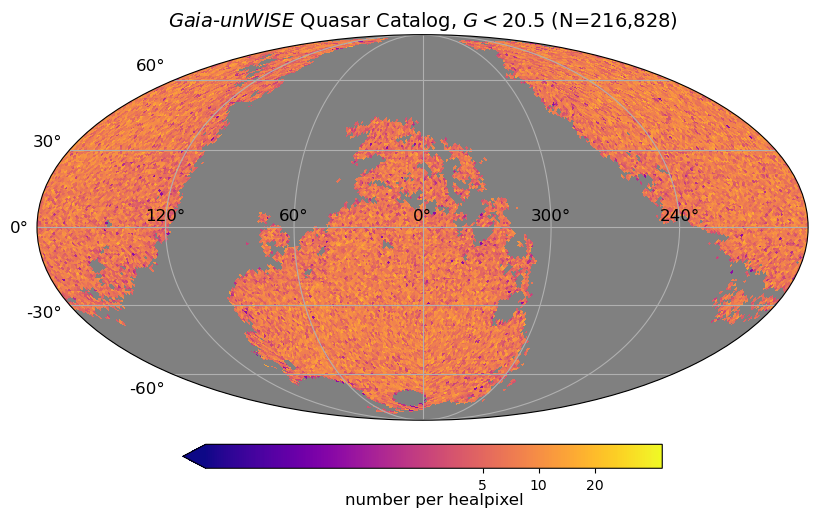

In [54]:
fac_stdev = 0.85
map_gcatlo = np.bincount(pixel_indices_datahi_bin0[pixel_indices_datahi_bin0_mask], minlength=NPIX)
print(np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), np.mean(map_gcatlo)+fac_stdev*np.std(map_gcatlo))
title_gcatlo = rf"{name_catalog}, $G<{G_hi}$ (N={N_gcatlo_mask:,})"
projview(map_gcatlo*hp.pixelfunc.nside2pixarea(NSIDE, degrees = True), title=title_gcatlo,
            unit=r"number per healpixel", cmap=cmap_map, coord=['C'], 
            min=np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), max=np.mean(map_gcatlo)+10*fac_stdev*np.std(map_gcatlo), 
            norm='log', graticule=True, cbar_ticks=cbar_ticks, graticule_labels=True)

In [55]:
idx = np.where(selfunc_hi_bin0==np.max(selfunc_hi_bin0))[0]

In [56]:
tab_datahi_mask_zbin0[pixel_indices_datahi_bin0==idx]

source_id,unwise_objid,redshift_quaia,redshift_quaia_err,ra,dec,l,b,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,mag_w1_vg,mag_w2_vg,pm,pmra,pmdec,pmra_error,pmdec_error
,,,,deg,deg,deg,deg,mag,mag,mag,mag,mag,mas / yr,mas / yr,mas / yr,mas / yr,mas / yr
int64,bytes16,float64,float64,float64,float64,float64,float64,float32,float32,float32,float64,float64,float64,float64,float64,float32,float32
1617229940573494528,2217p590o0022996,2.071,0.1735271363639832,220.91203814720322,59.33152933116509,99.75326138048491,52.45080582779197,20.13331,20.304892,19.627974,16.809397,15.965516,0.6294432311502884,-0.1815278316006606,-0.6026992845485032,0.52024186,0.56838465
1617239423861307520,2217p590o0024355,2.3414528369903564,0.056760000000000144,220.46877108747913,59.39121614483373,100.0914069025321,52.56139567326134,20.01885,20.123142,19.642414,16.914062,15.843377,0.5557766933532897,-0.31751930258082384,0.4561460570511422,0.40465447,0.51783174
1617266224457614080,2217p590o0031728,2.599733352661133,0.3433833524131773,221.34059069784848,59.73974820669445,99.9544518494288,52.00508855975709,20.28164,20.49761,19.750431,17.18459,16.241724,1.1184067881435122,-0.615044645922777,-0.9341058972553449,0.4317218,0.5464096
1617309208490061056,2188p590o0030727,2.9463768005371094,0.03967999999999994,219.83709535705802,59.722338633815085,100.84700530002749,52.53071356288135,19.61856,19.82269,19.260567,16.6275,15.865123,0.22298091941974613,0.16857998922456996,0.14594957231290265,0.25188932,0.29904908
1617347416519603200,2220p605o0008484,2.0423662662506104,0.09613637184143065,220.6302181889584,60.16511008480828,100.84744668099886,51.93587484157115,19.37405,19.60827,18.936605,15.622349,14.548639,0.4748643000200123,0.45947035611558174,0.11992954300136706,0.28389427,0.23568757


In [122]:
# Define the dimensionality of our problem.
ndim = 3

## Pick cosmology

In [123]:
cosmo = 'Planck'

In [124]:
N = 85

In [126]:
# Define our 3-D correlated multivariate normal log-likelihood.
C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
ix_grid = np.ix_(rpmask, rpmask)
    
def loglike(x, a, cf_matter, C, cf, n_q, nbins, cosmo = cosmo_planck18, error = 0.05):
    
    fduty, M_min, sigma = x
    
    bins_m = np.logspace(M_min, M_max, 79)
    n_m=HOD_scatter(10**fduty, M_min, bins_m, sigma)
    
    cf_2h_zbin, _ = cf_2h(bins_m, n_m, a, cosmo, cf_matter, recenter = False)
    delta = cf-cf_2h_zbin
    
    Cinv = np.linalg.inv(C)
    lnorm = -0.5 * (np.log(2 * np.pi) * nbins +
                    np.log(np.linalg.det(C)))
    
    n_q_theory = M(bins_m, n_m, a = a, cosmo = cosmo, recenter = False)[1]
    penalty = np.abs(n_q_theory-n_q)/n_q
    if penalty > error:
        penalty = np.inf
    
    return -0.5 * np.dot(delta, np.dot(Cinv, delta)) + lnorm - penalty

In [127]:
def ptform(u):
    """Transforms the uniform random variables `u ~ Unif[0., 1.)`
    to the parameters of interest."""

    x = np.array(u)  # copy u 

    # Uniform from -6 to 0
    x[0] =  6* u[0] - 6 # scale and shift to [-6., 0.)

    # Uniform from 9 to 15
    x[1] = 6 * u[1] + 9  # scale and shift to [9., 15.)
    
    # Uniform from 0 to 3.3
    x[2] = 3.3 * u[2]  # scale to [0., 3.3.)

    return x

In [128]:
# initialize our nested sampler
sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], C[ix_grid], cf_chi2[j][rpmask], n_q[j], nbins])

In [129]:
# run the sampler with checkpointing
sampler.run_nested(dlogz = 0.005)
results = sampler.results

3860it [00:55, 70.17it/s, +500 | bound: 55 | nc: 1 | ncall: 49675 | eff(%):  8.866 | loglstar:   -inf < -14.787 <    inf | logz: -21.722 +/-    nan | dlogz:  0.000 >  0.005]


In [130]:
# Print out a summary of the results.
results.summary()

Summary
nlive: 500
niter: 3860
ncall: 28675
eff(%):  8.866
logz: -21.722 +/-  0.113


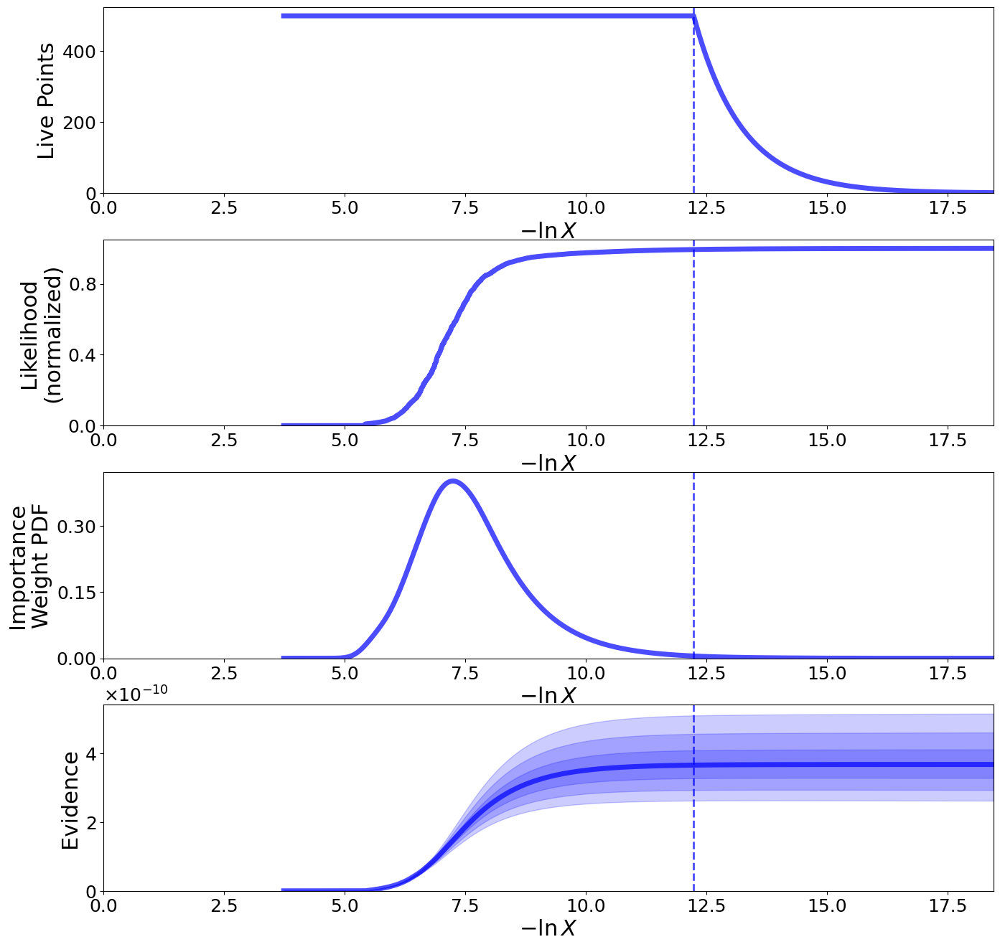

In [131]:
fig, axes = dyplot.runplot(results)  # summary (run) plot
fig.subplots_adjust(hspace=0.25)

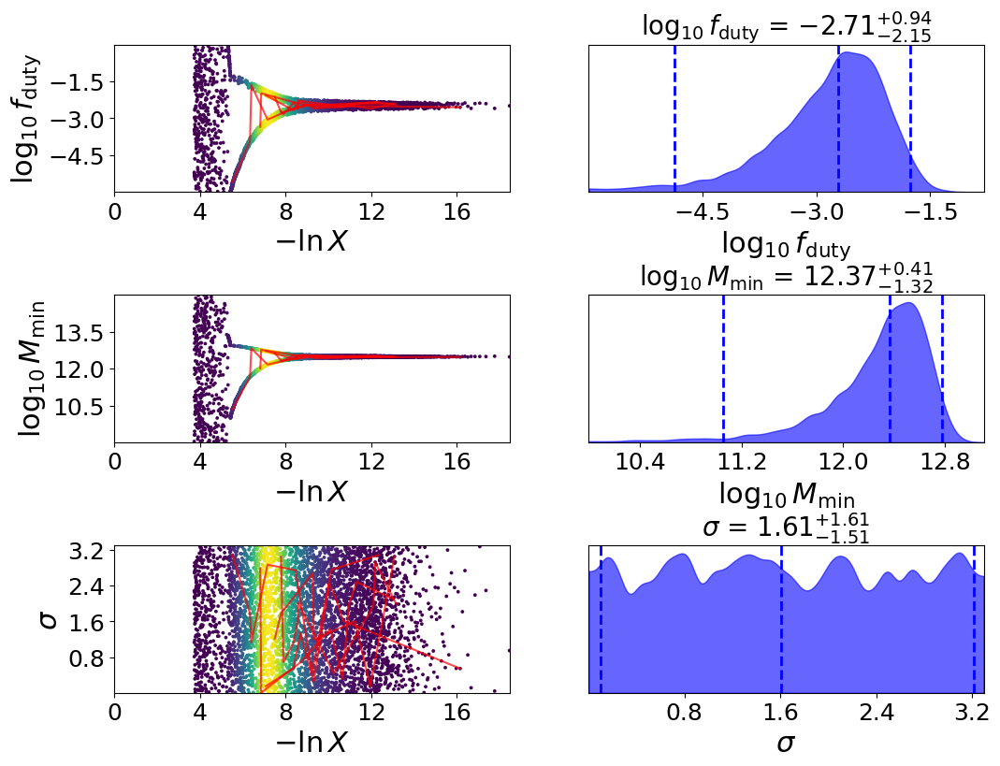

In [136]:
fig, axes = dyplot.traceplot(results, 
                             show_titles=True,
                             trace_cmap='viridis', connect=True,
                             connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'])
fig.subplots_adjust(hspace=0.7)

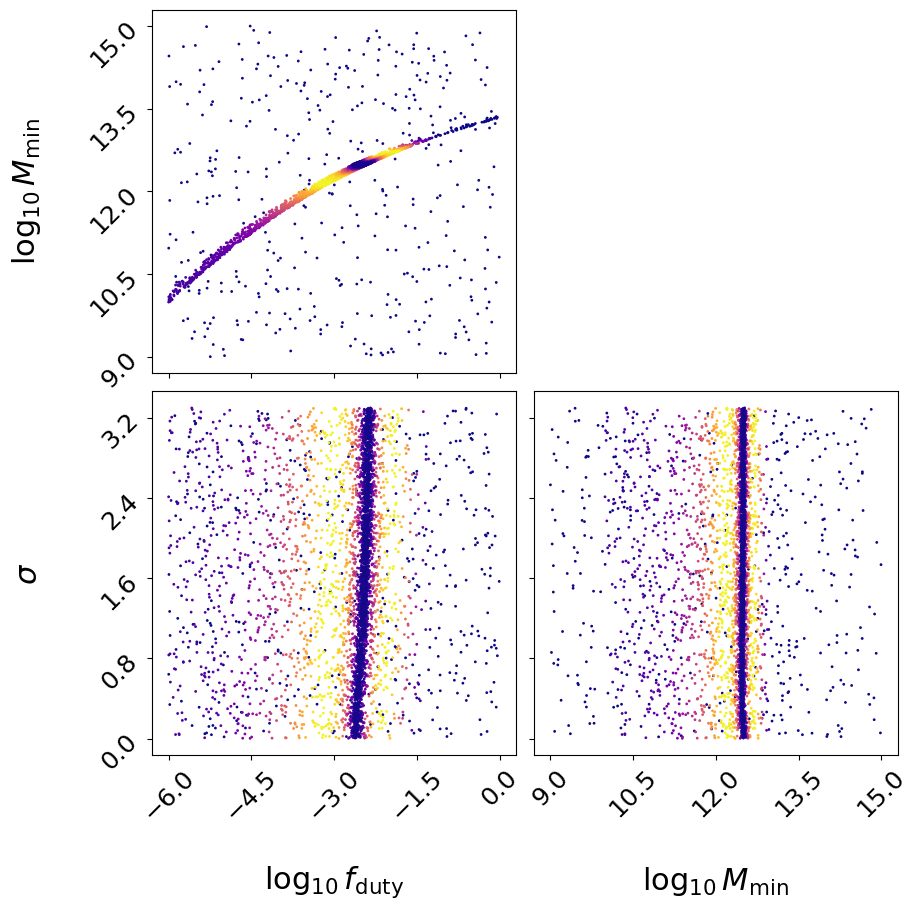

In [138]:
# initialize figure
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# plot initial run (res1; left)
fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                             kde=False, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'], fig=(fig, axes))

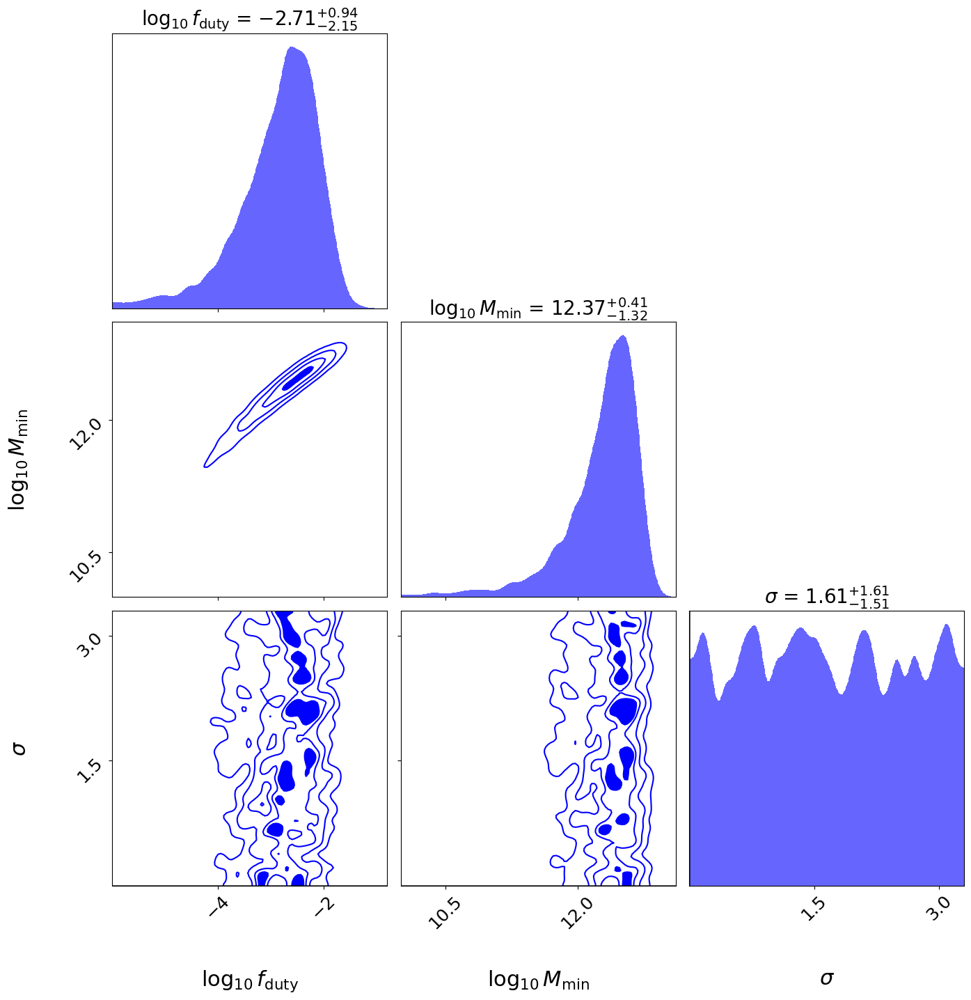

In [139]:
# # initialize figure
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# plot initial run (res1; left)
fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                           truth_color='black', show_titles=True,
                           max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'], fig=(fig, axes[:, :3]))

In [140]:
samples, weights = results.samples, results.importance_weights()
mean, cov = dyfunc.mean_and_cov(samples, weights)
print(mean, cov)

[-2.85413447 12.26616228  1.64658908] [[0.57600994 0.322125   0.05952505]
 [0.322125   0.18486683 0.00173783]
 [0.05952505 0.00173783 0.91014414]]


In [141]:
# Compute weighted quantiles
samples, weights = results.samples, results.importance_weights()

# Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
quantiles = [dyfunc.quantile(samples[:, i], [0.025, 0.5, 0.975], weights=weights) 
             for i in range(samples.shape[1])]
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']

for i, (lo, mid, hi) in enumerate(quantiles):
    print(f"{labels[i]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")

log10(f_duty): -2.71 + 0.94/-2.15
log10(M_min): 12.37 + 0.41/-1.32
sigma: 1.61 + 1.61/-1.51


## Across all $z$

4467it [00:35, 125.62it/s, +500 | bound: 38 | nc: 1 | ncall: 37045 | eff(%): 13.591 | loglstar:   -inf < 32.824 <    inf | logz: 24.843 +/-    nan | dlogz:  0.000 >  0.005]


Summary
nlive: 500
niter: 4467
ncall: 19545
eff(%): 13.591
logz: 24.843 +/-  0.123
0<z<=1
log10(f_duty): -2.62 + 0.13/-0.15
log10(M_min): 12.01 + 0.13/-0.15
sigma: 1.63 + 1.14/-1.06



4699it [00:46, 100.63it/s, +500 | bound: 43 | nc: 1 | ncall: 40387 | eff(%): 13.034 | loglstar:   -inf < 25.595 <    inf | logz: 17.166 +/-    nan | dlogz:  0.000 >  0.005] 


Summary
nlive: 500
niter: 4699
ncall: 22887
eff(%): 13.034
logz: 17.166 +/-  0.127
1<z<=2
log10(f_duty): -2.77 + 0.11/-0.10
log10(M_min): 11.91 + 0.08/-0.08
sigma: 1.62 + 1.19/-1.10



33it [00:01, 25.00it/s, bound: 2 | nc: 104 | ncall: 22872 | eff(%):  0.144 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.005]/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
4534it [00:42, 106.15it/s, +500 | bound: 45 | nc: 1 | ncall: 45726 | eff(%): 11.131 | loglstar:   -inf < 23.502 <    inf | logz: 15.190 +/-    nan | dlogz:  0.000 >  0.005]


Summary
nlive: 500
niter: 4534
ncall: 24226
eff(%): 11.131
logz: 15.190 +/-  0.126
2<z<=3
log10(f_duty): -2.57 + 0.15/-0.15
log10(M_min): 12.16 + 0.09/-0.10
sigma: 1.62 + 1.17/-1.08



3it [00:01,  2.51it/s, bound: 1 | nc: 247 | ncall: 22669 | eff(%):  0.013 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.005]/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
3851it [01:13, 52.71it/s, +500 | bound: 49 | nc: 1 | ncall: 47906 | eff(%):  9.178 | loglstar:   -inf < -14.787 <    inf | logz: -21.767 +/-    nan | dlogz:  0.000 >  0.005]


Summary
nlive: 500
niter: 3851
ncall: 25906
eff(%):  9.178
logz: -21.767 +/-  0.114
3<z<=4
log10(f_duty): -2.68 + 0.52/-0.73
log10(M_min): 12.39 + 0.23/-0.39
sigma: 1.65 + 1.10/-1.10



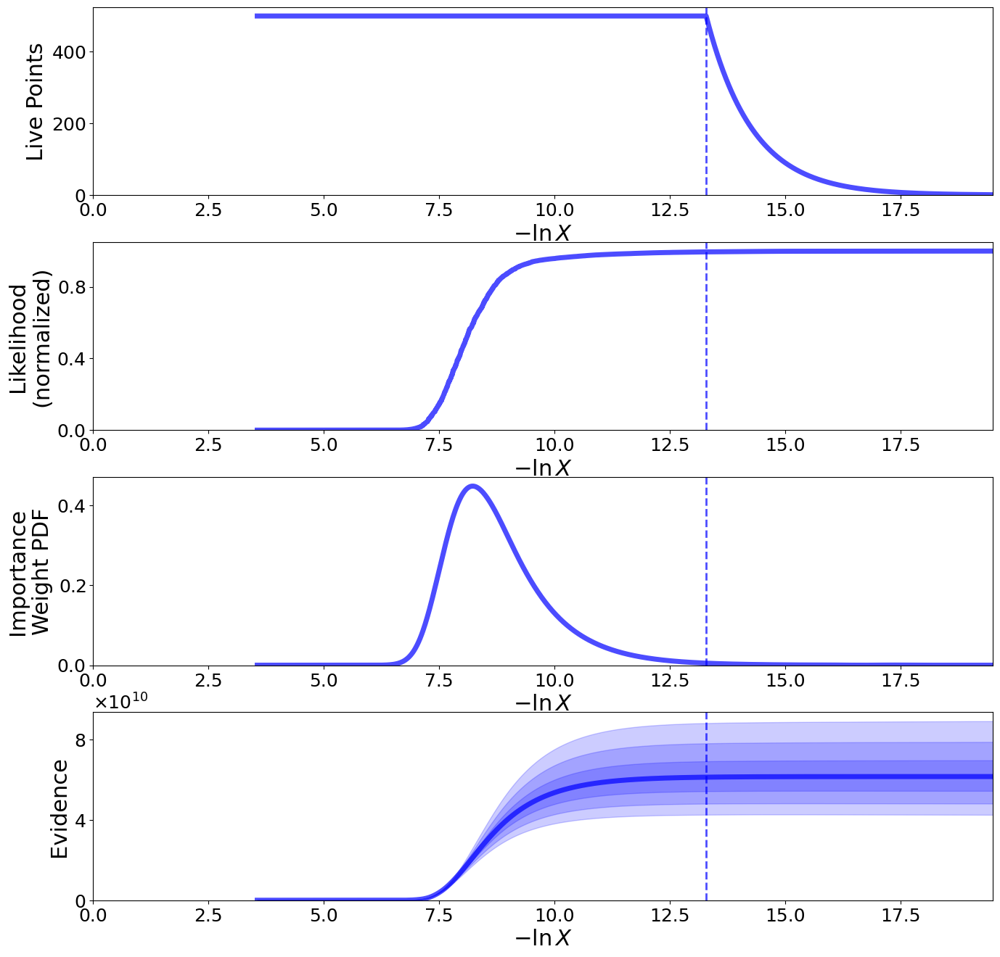

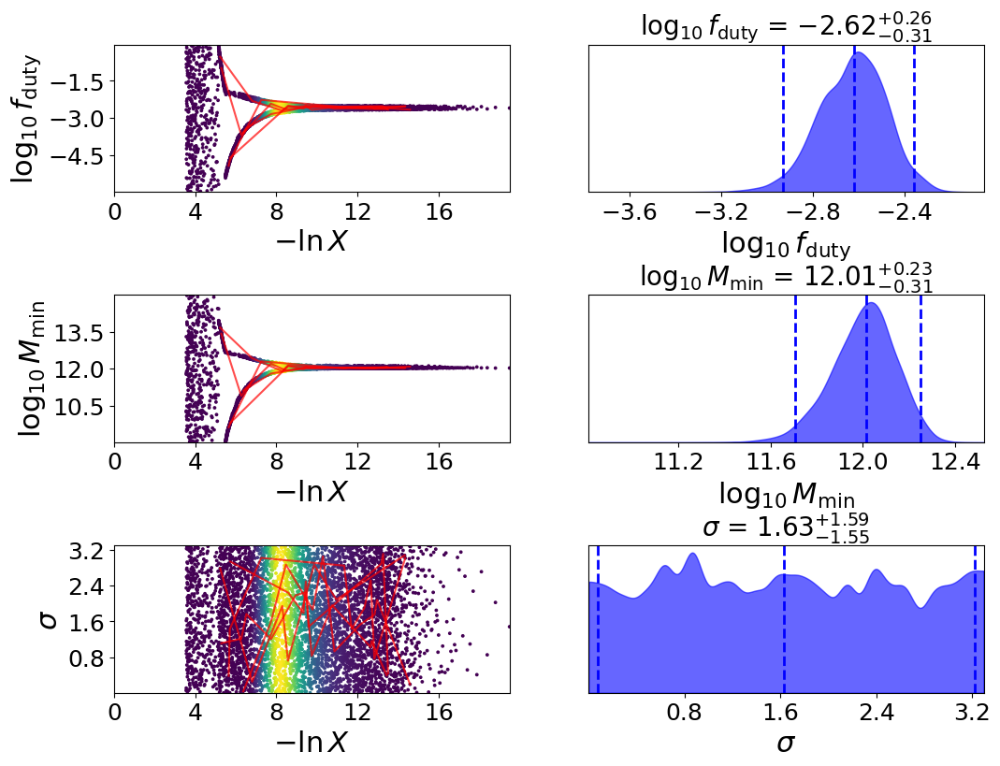

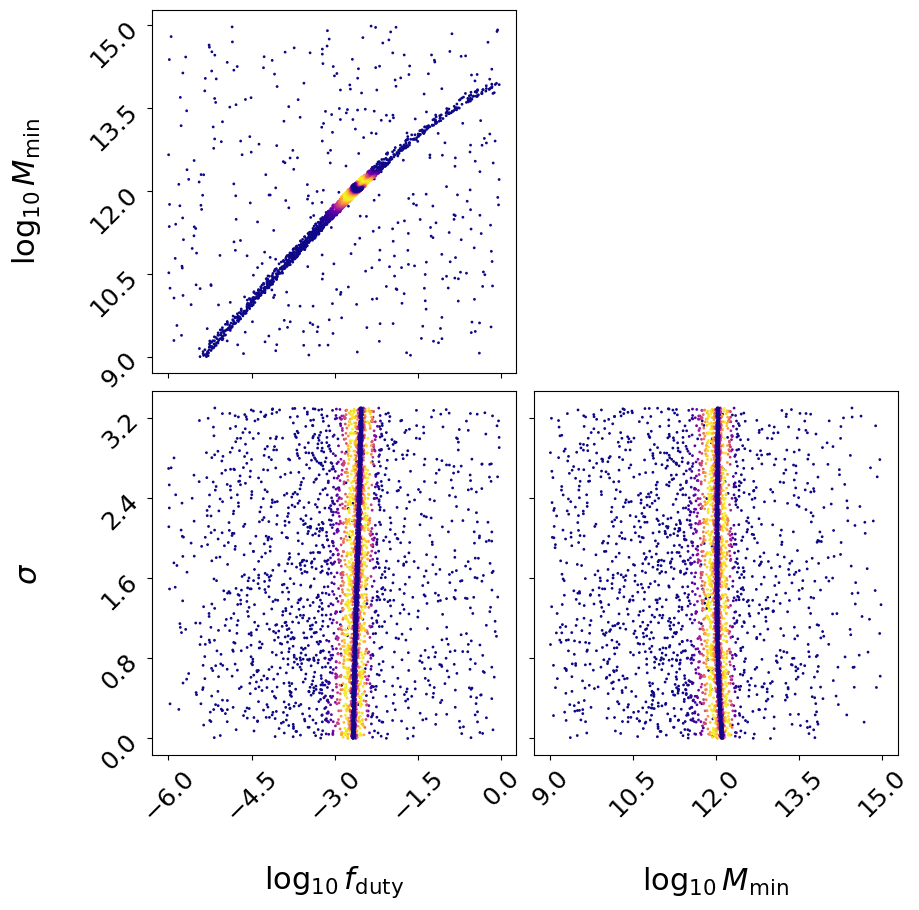

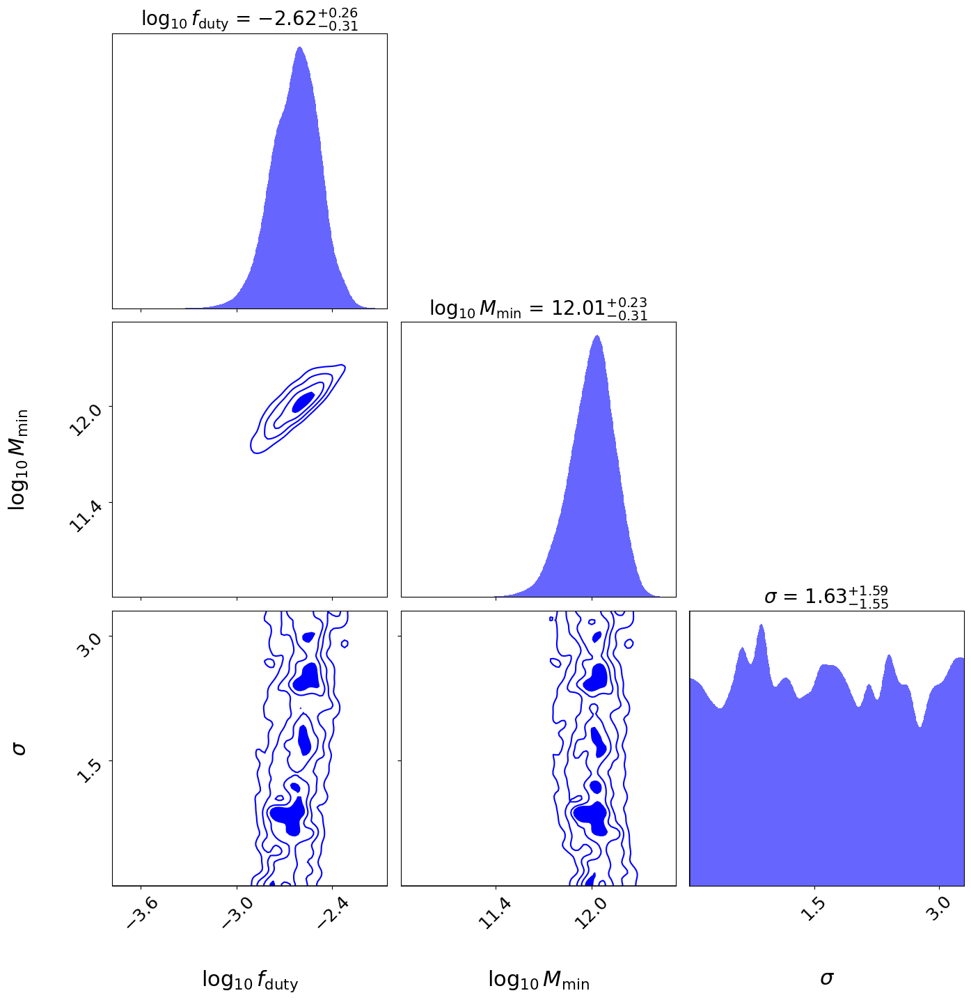

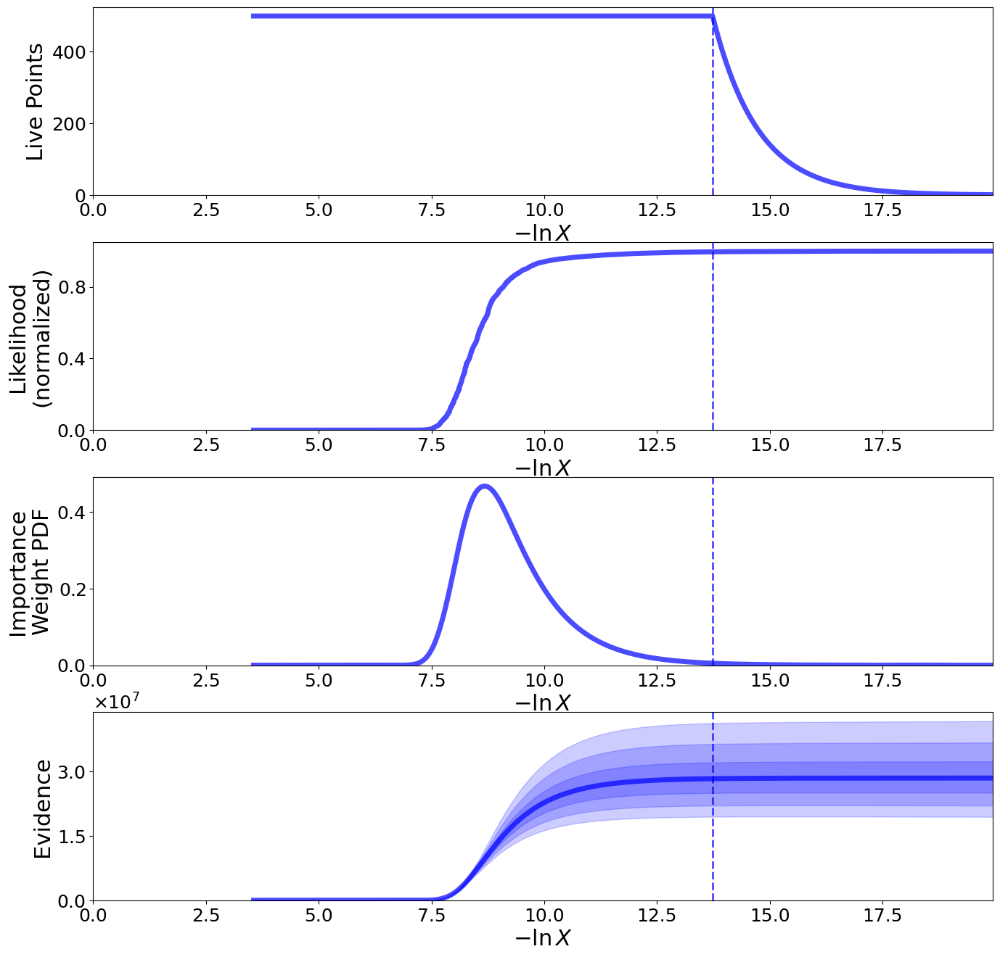

...

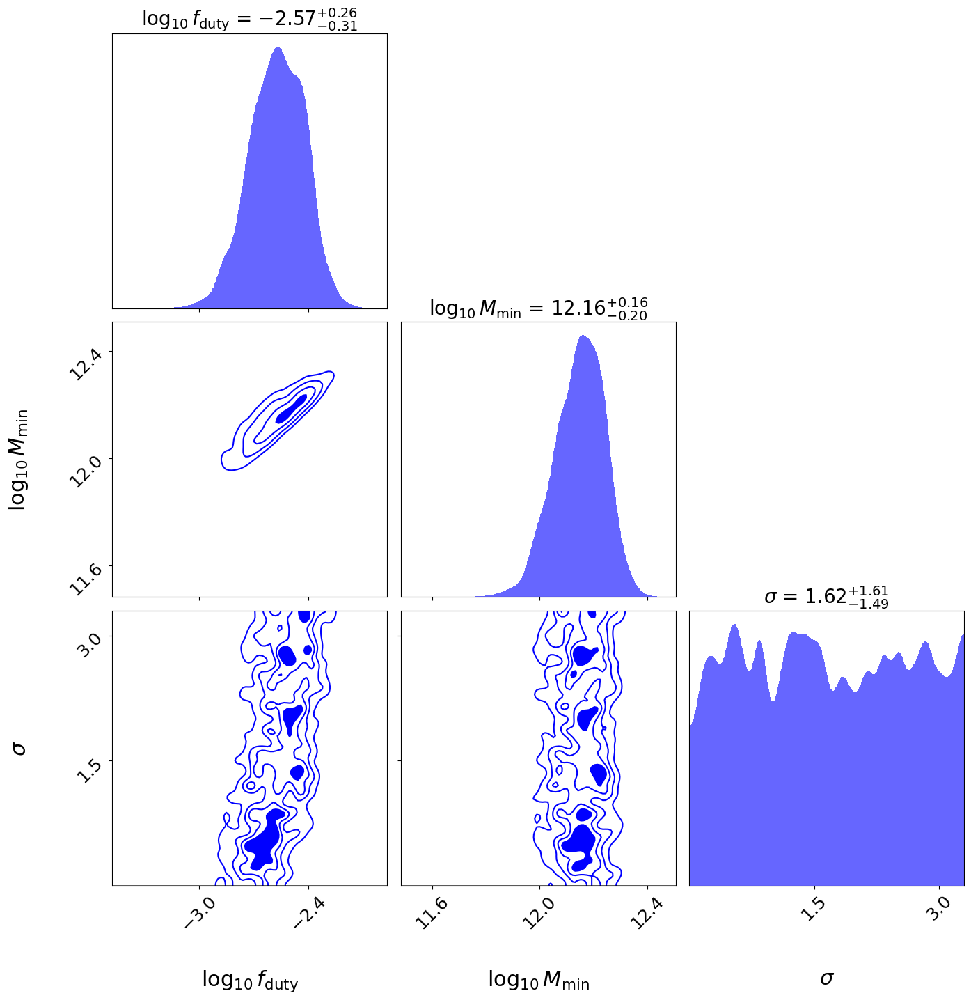

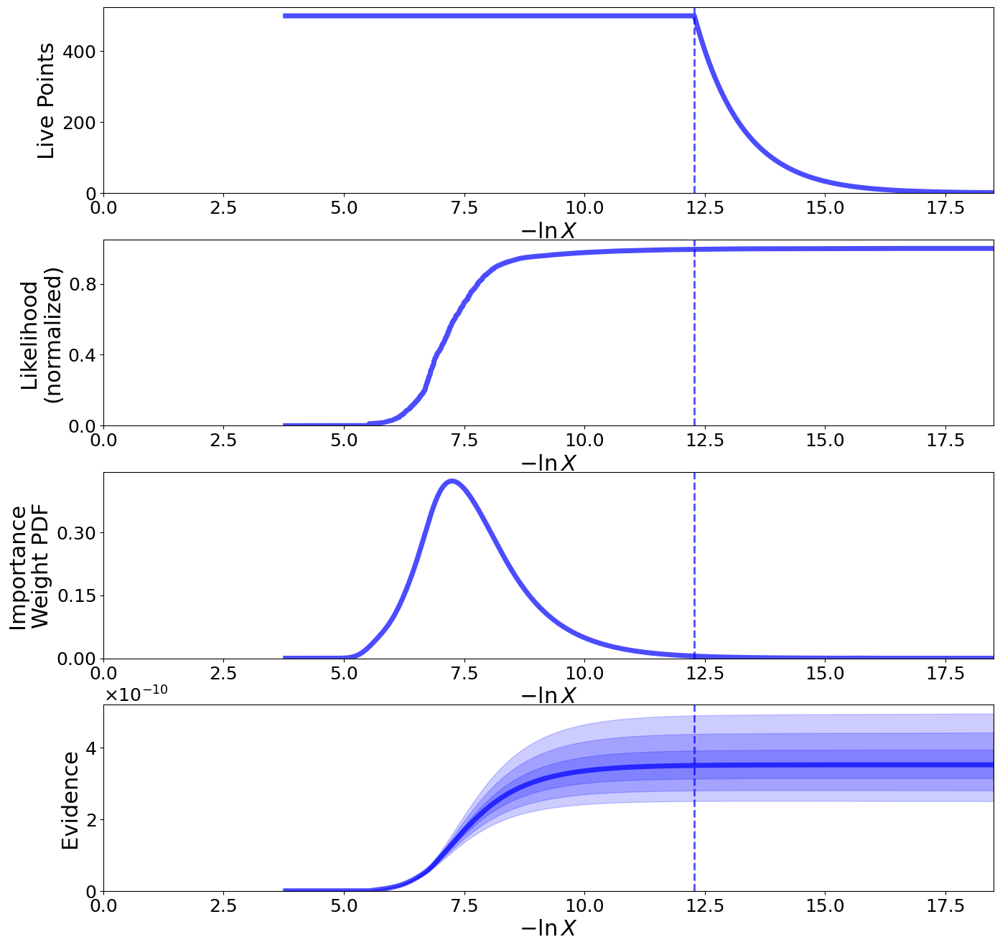

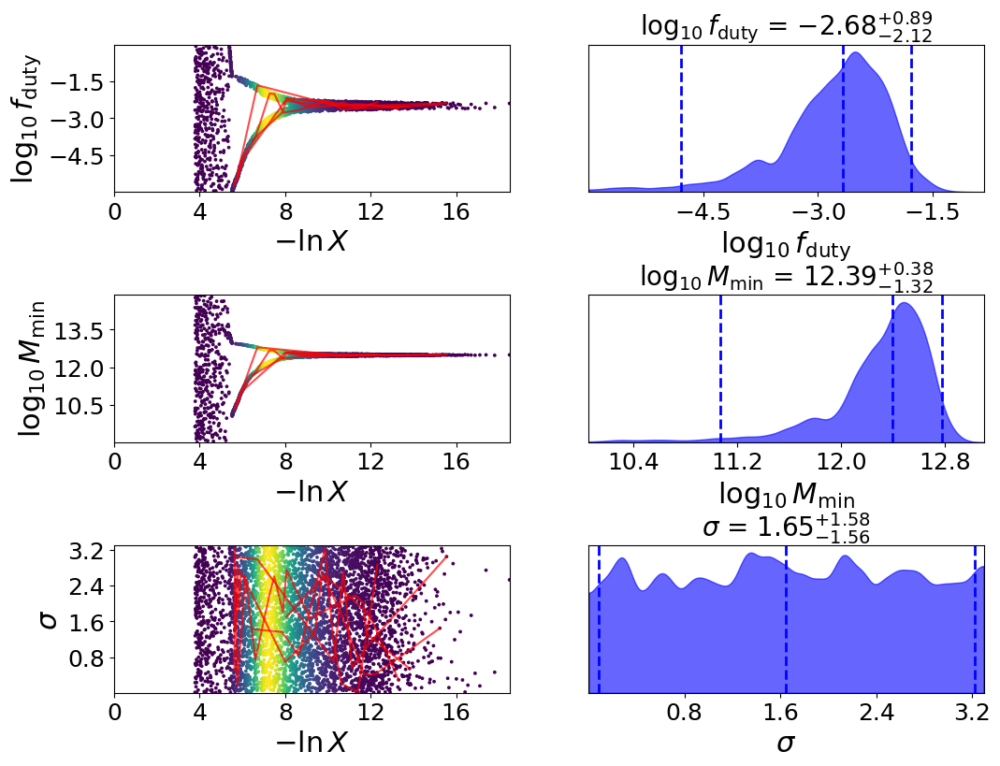

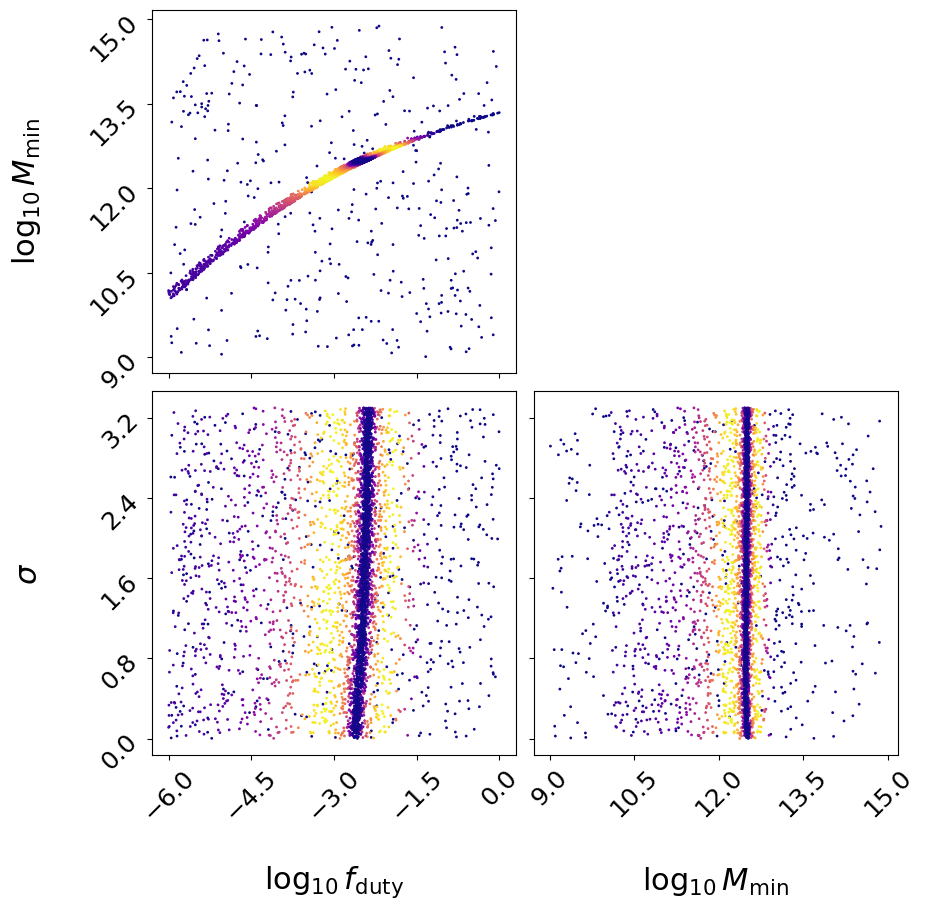

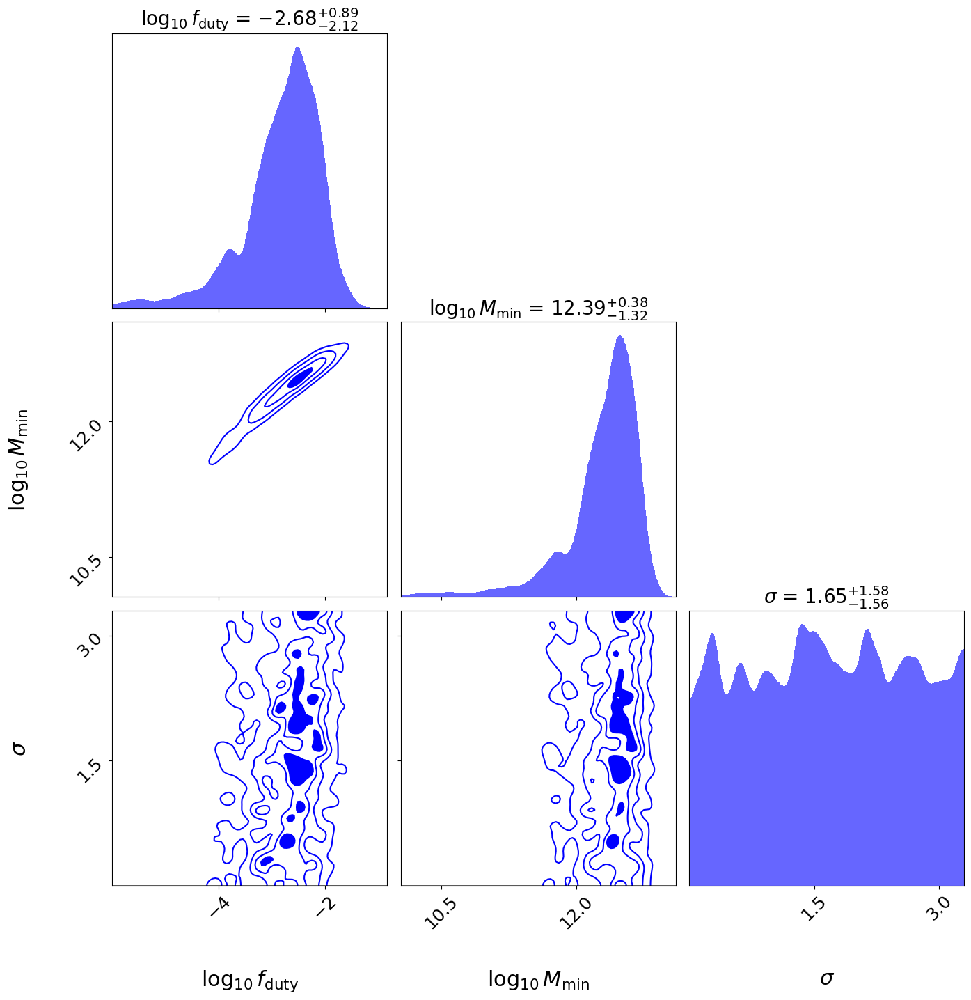

In [143]:
f_duty, M_min, sigma = [], [], []
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']
err = {i: [] for i in labels}
f_duty_samples, M_min_samples, sigma_samples = [], [], []
for j in z_array:

    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    ix_grid = np.ix_(rpmask, rpmask)

    # initialize our nested sampler
    sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], C[ix_grid], cf_chi2[j][rpmask], n_q[j], nbins])
    
    # run the sampler with checkpointing
    sampler.run_nested(dlogz = 0.005)
    results = sampler.results
    
    # Print out a summary of the results.
    results.summary()
    
    fig, axes = dyplot.runplot(results)  # summary (run) plot
    fig.subplots_adjust(hspace=0.25)
    
    fig, axes = dyplot.traceplot(results, 
                                 show_titles=True,
                                 trace_cmap='viridis', connect=True,
                                 connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'])
    fig.subplots_adjust(hspace=0.7)
    
    # initialize figure
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                                 kde=False, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'], fig=(fig, axes))
    
    ## # initialize figure
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                               truth_color='black', show_titles=True,
                               max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\sigma$'], fig=(fig, axes[:, :3]))
    
    samples, weights = results.samples, results.importance_weights()

    # Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
    quantiles = [dyfunc.quantile(samples[:, i], [0.16, 0.5, 0.84], weights=weights) 
                 for i in range(samples.shape[1])]

    print('{}<z<={}'.format(j, j+1))
    for i, (lo, mid, hi) in enumerate(quantiles):
        print(f"{labels[i]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")
        err[labels[i]].append((lo, hi))
    print()
    
    equal_weight_samples = dyfunc.resample_equal(samples, weights)
    ind = np.random.choice(range(len(equal_weight_samples)), size = 1000, replace = False)
    f_duty_samples.append(equal_weight_samples[ind][:,0])
    M_min_samples.append(equal_weight_samples[ind][:,1])
    sigma_samples.append(equal_weight_samples[ind][:,2])
    
    f_duty.append(quantiles[0][1])
    M_min.append(quantiles[1][1]) 
    sigma.append(quantiles[2][1]) 

## Plot results

In [146]:
zbin = 1/np.array(a_zbin)-1

In [147]:
z_eff = [0.5, 1.5, 2.5, 3.5]

<>:5: SyntaxWarning: invalid escape sequence '\l'
<>:5: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_251151/1539354056.py:5: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')


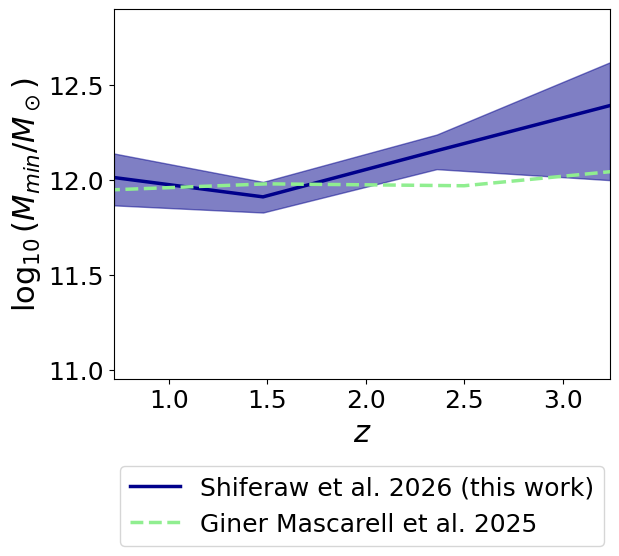

In [148]:
M_min_lo, M_min_hi = np.array(err['log10(M_min)'])[:,0], np.array(err['log10(M_min)'])[:,1]
plt.plot(zbin, M_min, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, M_min_lo, M_min_hi, alpha = 0.5, color = 'darkblue')
plt.plot(z_eff, M_min_array, label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(10.95,12.9)
plt.show()

In [149]:
f_duty_giner = [0.001986832927349008, 0.001968631474455283, 0.002978657298062041, 0.001968631474455283]

<>:5: SyntaxWarning: invalid escape sequence '\l'
<>:5: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_251151/2999220170.py:5: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(f_{duty})$')


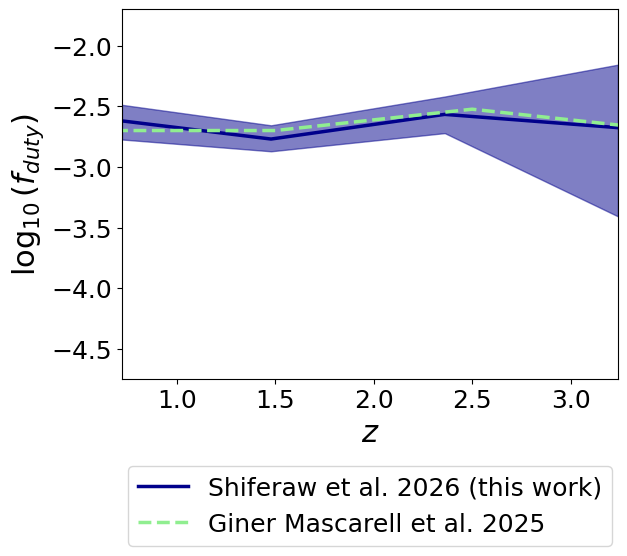

In [150]:
f_duty_lo, f_duty_hi = np.array(err['log10(f_duty)'])[:,0], np.array(err['log10(f_duty)'])[:,1]
plt.plot(zbin, f_duty, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, f_duty_lo, f_duty_hi, alpha = 0.5, color = 'darkblue')
plt.plot(z_eff, np.log10(fduty), label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.ylabel('$\log_{10}(f_{duty})$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(-4.75,-1.7)
plt.show()

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_251151/2155796066.py:4: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel('$\sigma$')


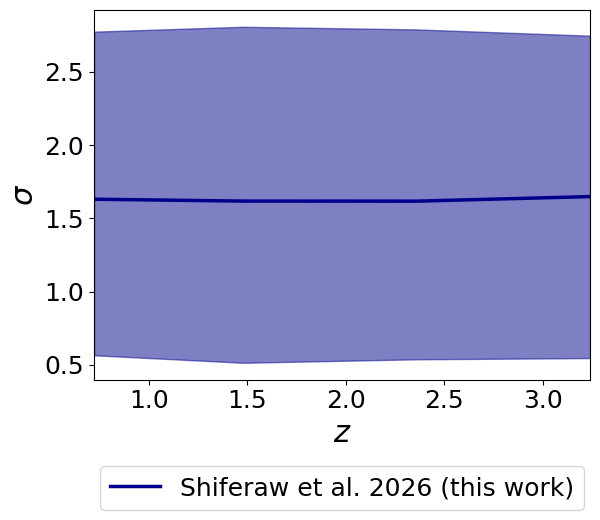

In [152]:
sigma_lo, sigma_hi = np.array(err['sigma'])[:,0], np.array(err['sigma'])[:,1]
plt.plot(zbin, sigma, color = 'darkblue', linewidth = 2.5, label = 'Shiferaw et al. 2026 (this work)')
plt.fill_between(zbin, sigma_lo, sigma_hi, alpha = 0.5, color = 'darkblue')
plt.ylabel('$\sigma$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
# plt.ylim(-4.75,-1.7)
plt.show()

In [153]:
b_eff_cf20 = np.load('../results/b_eff_cf20_planck18.npy')

## Calculate 16th and 84th percentile of derived parameters

In [58]:
cf_2h_samples, b_q_samples=[], []
for i in range(len(ind)):
    n_m=np.ones(np.shape(bins))*10**f_duty_samples[j][i]
    cf_2h_sample, b_q_sample = cf_2h(np.logspace(M_min_samples[j][i],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    cf_2h_samples.append(cf_2h_sample)
    b_q_samples.append(b_q_sample)
cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
b_q_16, b_q_50, b_q_84 = np.percentile(b_q_samples, [16, 50, 84])

In [59]:
n_m=np.ones(np.shape(bins))*10**f_duty[j]
cf_2h_zbin, b_q = cf_2h(np.logspace(M_min[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
cf_2h_50-cf_2h_zbin

array([-8.72164110e-02, -4.36975594e-02, -2.61613846e-02, -1.71696365e-02,
       -1.19345193e-02, -8.63348524e-03, -6.43365779e-03, -4.90485135e-03,
       -3.80855871e-03, -3.00292378e-03, -2.39796785e-03, -1.93585329e-03,
       -1.57738839e-03, -1.29561205e-03, -1.07117861e-03, -8.90444274e-04,
       -7.43526340e-04, -6.23265317e-04, -5.24199300e-04, -4.42033301e-04,
       -3.74025189e-04, -3.16969711e-04, -2.69356525e-04, -2.28843935e-04,
       -1.94999446e-04, -1.65442626e-04, -1.40167554e-04, -1.17863992e-04,
       -9.79895569e-05, -8.05244693e-05, -6.54684410e-05, -5.30259928e-05,
       -4.45018610e-05, -4.18777842e-05, -4.63012441e-05, -5.90861898e-05,
       -7.68106137e-05, -9.42875250e-05, -1.05221553e-04, -1.06174993e-04,
       -9.75681005e-05, -8.24757789e-05, -6.45822895e-05, -4.67989905e-05,
       -3.08691433e-05, -1.75377099e-05, -6.89023580e-06,  1.32417121e-06,
        7.47636340e-06,  1.19574170e-05,  1.51336432e-05,  1.73131638e-05,
        1.87350073e-05,  

In [60]:
cf_2h_zbin_lo, b_q_lo = cf_2h(np.logspace(M_min_lo[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
cf_2h_zbin_hi, b_q_hi = cf_2h(np.logspace(M_min_hi[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                        recenter = False)

In [61]:
cf_2h_zbin_lo-cf_2h_16, cf_2h_zbin_hi-cf_2h_84

(array([3.22281081e-02, 1.61470720e-02, 9.66712482e-03, 6.34450437e-03,
        4.41002988e-03, 3.19023556e-03, 2.37735785e-03, 1.81243504e-03,
        1.40733425e-03, 1.10963695e-03, 8.86094329e-04, 7.15334287e-04,
        5.82874747e-04, 4.78753078e-04, 3.95820690e-04, 3.29035946e-04,
        2.74747000e-04, 2.30308285e-04, 1.93701524e-04, 1.63339638e-04,
        1.38209359e-04, 1.17126284e-04, 9.95323139e-05, 8.45621481e-05,
        7.20559714e-05, 6.11341692e-05, 5.17945538e-05, 4.35529669e-05,
        3.62089886e-05, 2.97553095e-05, 2.41918232e-05, 1.95941040e-05,
        1.64442766e-05, 1.54746308e-05, 1.71091826e-05, 2.18334611e-05,
        2.83829698e-05, 3.48410180e-05, 3.88813474e-05, 3.92336616e-05,
        3.60532525e-05, 3.04763552e-05, 2.38643735e-05, 1.72931093e-05,
        1.14067304e-05, 6.48051443e-06, 2.54607203e-06, 4.39657644e-05,
        2.48233784e-04, 3.97015864e-04, 5.02474440e-04, 5.74839925e-04,
        6.22048651e-04, 6.50236344e-04, 6.64222382e-04, 6.676729

<>:73: SyntaxWarning: invalid escape sequence '\l'
<>:73: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_32939/2853167586.py:73: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


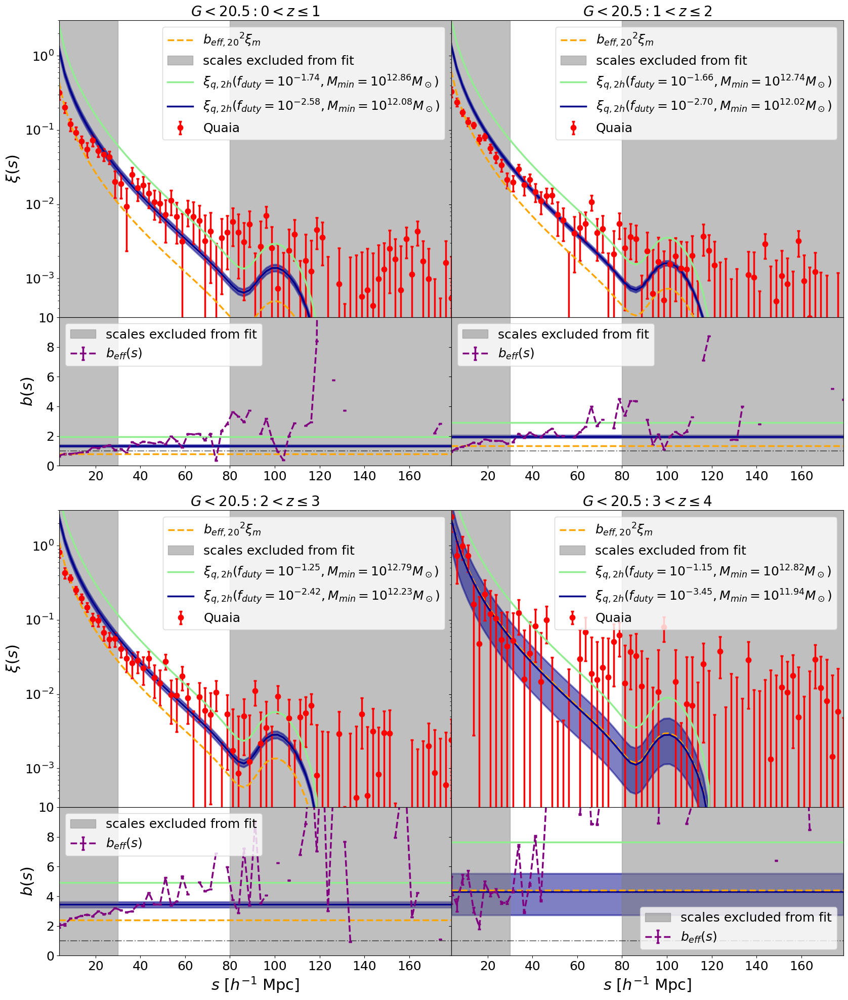

In [62]:
fig = plt.figure(figsize = (20, 24))
gs = gridspec.GridSpec(5, 2, height_ratios = [1, 0.5, 0.15, 1, 0.5], hspace = 0, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+k])
    ax2 = fig.add_subplot(gs[j+k+2])
    
    # C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, rmin, rmax, nbins, j, cosmo)) # [np.ix_([False]+[True]*20+[False], [False]+[True]*20+[False])] # very good
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.plot(quaia.recenter(rbins_chi2), b_eff_cf20[j]**2*cf_matter_chi2[j], linewidth = 2.5,
             label = r'${b_{eff, 20}}^2\xi_m$', color = 'orange', linestyle = '--')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # old fit
    cf_2h_zbin, b_q = cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5, 
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(np.log10(fduty[j]), M_min_array[j]),
             color = 'lightgreen')
    ax2.axhline(b_q, linewidth = 2.5, color = 'lightgreen')

    # plot new fit
    n_m=np.ones(np.shape(bins))*f_duty[j]
    cf_2h_zbin, b_q = cf_2h(np.logspace(M_min[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[j], M_min[j]), 
             color = 'darkblue')
    
    cf_2h_samples, b_q_samples=[], []
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*10**f_duty_samples[j][i]
        cf_2h_sample, b_q_sample = cf_2h(np.logspace(M_min_samples[j][i],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)
        cf_2h_samples.append(cf_2h_sample)
        b_q_samples.append(b_q_sample)
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    b_q_16, b_q_50, b_q_84 = np.percentile(b_q_samples, [16, 50, 84])

    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')
    ax2.axhline(b_q, linewidth = 2.5, color = 'darkblue')
    ax2.fill_between(quaia.recenter(rbins_chi2), [b_q_16]*nbins, [b_q_84]*nbins, linewidth = 2.5, color = 'darkblue', alpha = 0.5)

    # ax1.plot(quaia.recenter(rbins_chi2), cf_2h_50, linewidth = 2.5,
    #          label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[j], M_min[j]),
    #          color = 'darkblue')
    # cf_2h_zbin_lo, b_q_lo = cf_2h(np.logspace(M_min_lo[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    # cf_2h_zbin_hi, b_q_hi = cf_2h(np.logspace(M_min_hi[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    # ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_zbin_lo, cf_2h_zbin_hi, linewidth = 2.5, alpha = 0.5,
    #          color = 'darkblue')
    # ax2.axhline(b_q_50, linewidth = 2.5, color = 'darkblue')
    # ax2.fill_between(quaia.recenter(rbins_chi2), [b_q_lo]*nbins, [b_q_hi]*nbins, linewidth = 2.5, color = 'darkblue', alpha = 0.5)
    
    ax2.errorbar(quaia.recenter(rbins_chi2), b_cf_chi2[j], linewidth = 2.5, linestyle = '--', markeredgewidth = 2.5, capsize = 2.5,
                 color = 'purple', yerr = np.sqrt(np.diag(C)), label = '$b_{eff}(s)$')
    ax2.axhline(b_eff_cf20[j], linewidth = 2.5, color = 'orange', linestyle = '--')
    ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)
    
    if (j + k) % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_xticklabels([])
    ax1.set_ylim(3e-4, 3)
    ax1.legend()

    ax2.axhline(1, linestyle = '-.', color = 'black', alpha = 0.5)
    ax2.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax2.set_ylim(0, 10)
    ax2.legend()
    
    if (j+k) % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')
        ax2.set_ylabel(r'$b(s)$')

    else:
        ax1.set_yticklabels([])
        ax2.set_yticklabels([])

    if k != 0:
        ax2.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=4

plt.show()

<>:45: SyntaxWarning: invalid escape sequence '\l'
<>:45: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_32939/1626812543.py:45: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


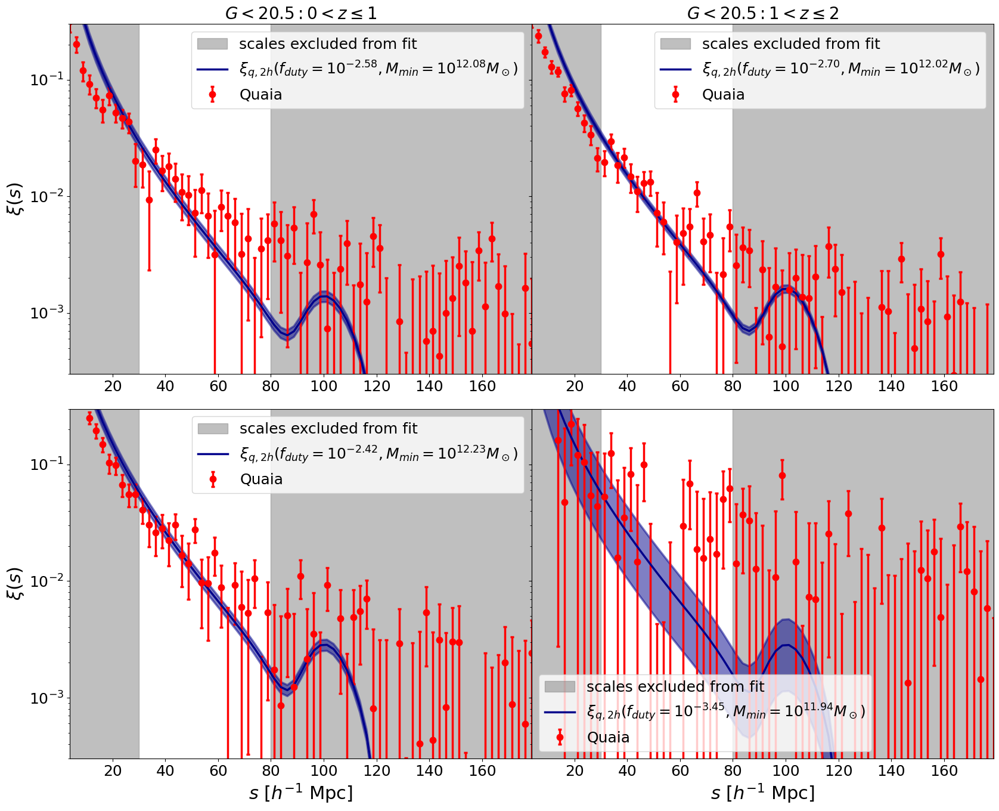

In [63]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, hspace = 0.1, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j])
    
    # C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, rmin, rmax, nbins, j, cosmo)) # [np.ix_([False]+[True]*20+[False], [False]+[True]*20+[False])] # very good
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
           
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    n_m=np.ones(np.shape(bins))*f_duty[j]
    cf_2h_zbin, b_q = cf_2h(np.logspace(M_min[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[j], M_min[j]), 
             color = 'darkblue')

    cf_2h_samples = []
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*f_duty_samples[j][i]
        cf_2h_sample, _ = cf_2h(np.logspace(M_min_samples[j][i],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)
        cf_2h_samples.append(cf_2h_sample)
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')    
    # cf_2h_zbin_lo, b_q_lo = cf_2h(np.logspace(M_min_lo[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    # cf_2h_zbin_hi, b_q_hi = cf_2h(np.logspace(M_min_hi[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
    #                         recenter = False)
    # ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_zbin_lo, cf_2h_zbin_hi, linewidth = 2.5, alpha = 0.5,
    #          color = 'darkblue')

    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')
        # ax2.set_ylabel(r'$b(s)$')

    else:
        ax1.set_yticklabels([])
        # ax2.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=2

plt.show()

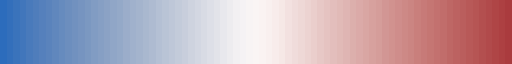

In [65]:
cmap_M_min = sns.color_palette("vlag", n_colors = len(bins))
palette_M_min = matplotlib.colors.ListedColormap(cmap_M_min)
palette_M_min

<>:43: SyntaxWarning: invalid escape sequence '\l'
<>:62: SyntaxWarning: invalid escape sequence '\D'
<>:43: SyntaxWarning: invalid escape sequence '\l'
<>:62: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_32939/846967146.py:43: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
/tmp/ipykernel_32939/846967146.py:62: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')


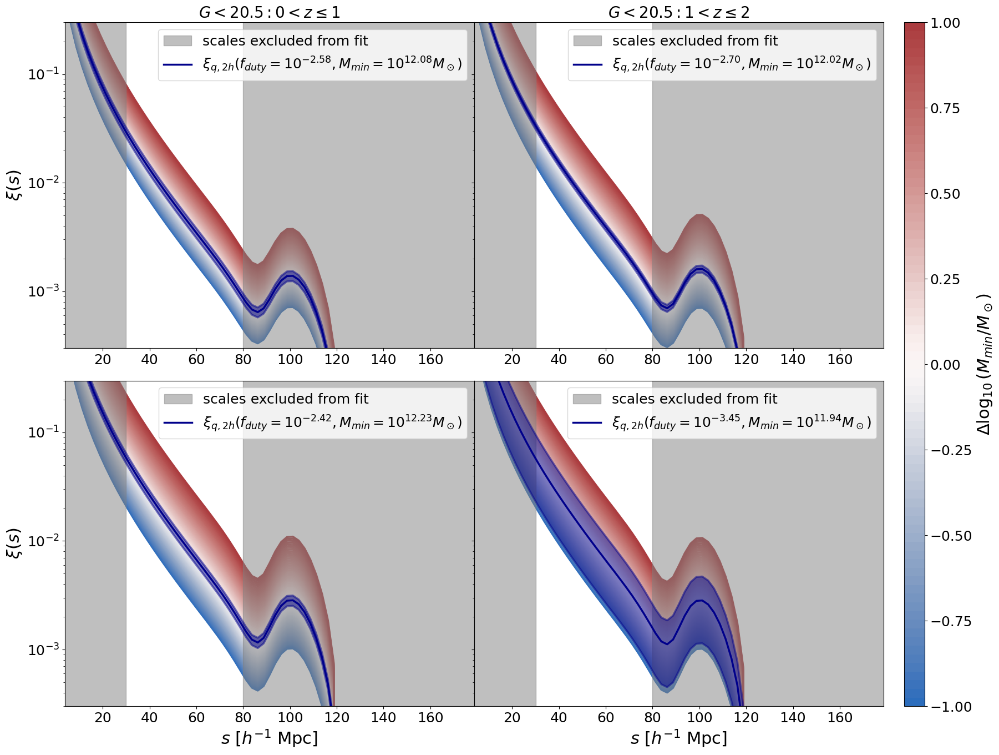

In [66]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 4, hspace = 0.1, wspace = 0, width_ratios = [1,1,0.05,0.05])

l = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+l])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
           
    # ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
    #             yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
    ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    n_m=np.ones(np.shape(bins))*f_duty[j]
    cf_2h_zbin, b_q = cf_2h(np.logspace(M_min[j],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[j], M_min[j]), 
             color = 'darkblue')

    for k in range(len(bins)):
        cf_2h_sample, _ = cf_2h(np.logspace(M_min[j]-1+k/int(len(bins)/2), M_max, 79), n_m, a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)
        ax1.plot(quaia.recenter(rbins_chi2), cf_2h_sample, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))
        
    cf_2h_samples = []
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*f_duty_samples[j][i]
        cf_2h_sample, _ = cf_2h(np.logspace(M_min_samples[j][i],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)
        cf_2h_samples.append(cf_2h_sample)
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')    
    
    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j == 1:
        l+=2

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
                label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
plt.show()

In [67]:
b_q_percentile = []
for j in z_array:
    b_q_samples=[]
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*10**f_duty_samples[j][i]
        b_q_samples.append(cf_2h(np.logspace(M_min_samples[j][i],M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[1])
    b_q_percentile.append(np.percentile(b_q_samples, [16, 84]))
b_q_lo, b_q_hi = np.array(b_q_percentile).T

<>:56: SyntaxWarning: invalid escape sequence '\D'
<>:56: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_32939/2217826274.py:56: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')


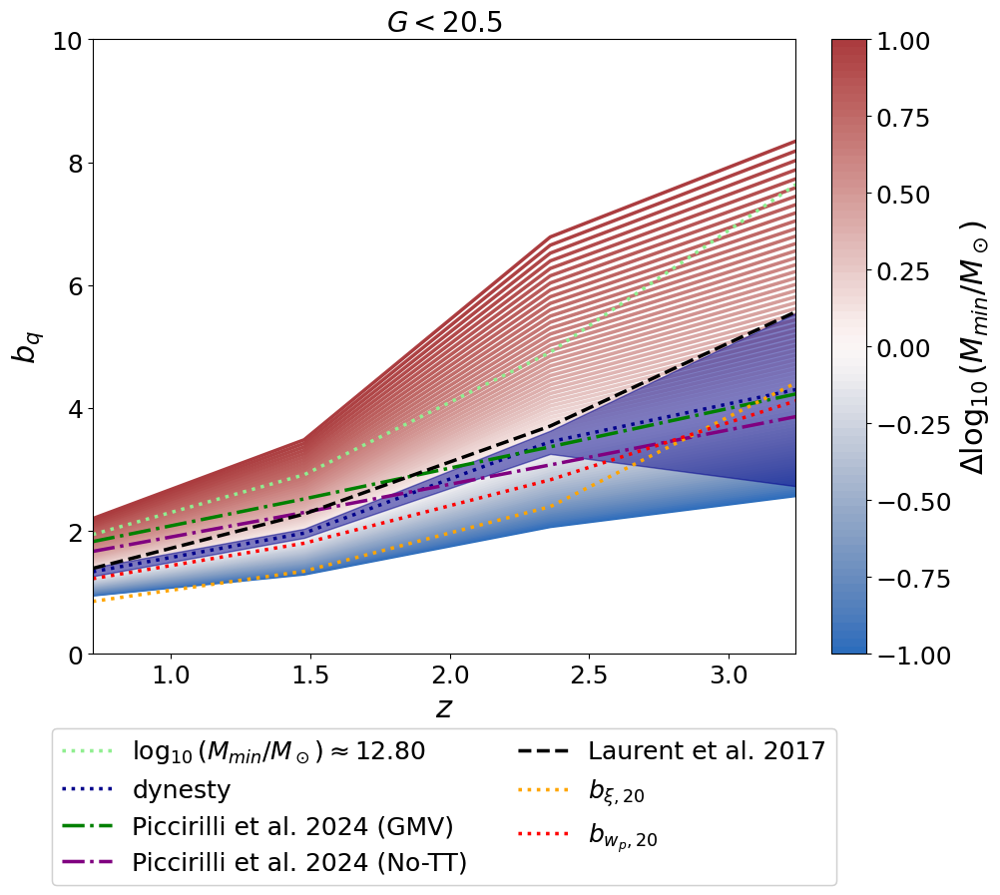

In [68]:
fig = plt.figure(figsize = (10, 8))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
ax1 = fig.add_subplot(gs[0])
    
b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
             recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

b_q = [cf_2h(np.logspace(M_min[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a_zbin[j], cosmo_planck18, 
             cf_matter_chi2[j], recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# b_q_lo = [cf_2h(np.logspace(M_min_lo[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a_zbin[j], cosmo_planck18, 
#              cf_chi2[j], recenter = False)[1] for j in z_array]
# b_q_hi = [cf_2h(np.logspace(M_min_hi[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a_zbin[j], cosmo_planck18, 
#              cf_chi2[j], recenter = False)[1] for j in z_array]
ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

for k in range(len(bins)):
    b_q = [cf_2h(np.logspace(M_min[j]-1+k/int(len(bins)/2), M_max, 79), np.ones(np.shape(bins))*f_duty[j], a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
    ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
         color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

ax1.set_title('$G<{}$'.format(G_hi))

ax1.set_xlabel('$z$')
ax1.set_ylim(0, 10)
ax1.set_xlim(zbin[0], zbin[-1])
ax1.set_ylabel(r'$b_q$')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'green', linestyle = '-.', linewidth = 2.5), 
                Line2D([0], [0], color = 'purple', linestyle = '-.', linewidth = 2.5),
                Line2D([0], [0], color = 'black', linestyle = '--', linewidth = 2.5), 
                Line2D([0], [0], color = 'orange', linestyle = ':', linewidth = 2.5), 
                Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Piccirilli et al. 2024 (GMV)', 'Piccirilli et al. 2024 (No-TT)', 
                                          'Laurent et al. 2017', r'$b_{\xi, 20}$', '$b_{w_p, 20}$'], ncol = 2, bbox_to_anchor = (0.5, -0.1), 
                           loc='upper center')
fig.add_artist(second_legend)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
plt.show()

In [69]:
M_h_percentile = []
for j in z_array:
    M_h_samples=[]
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*10**f_duty_samples[j][i]
        M_h_samples.append(M(np.logspace(M_min_samples[j][i], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0])
    M_h_percentile.append(np.percentile(M_h_samples, [16, 84]))
M_h_lo, M_h_hi = np.array(M_h_percentile).T

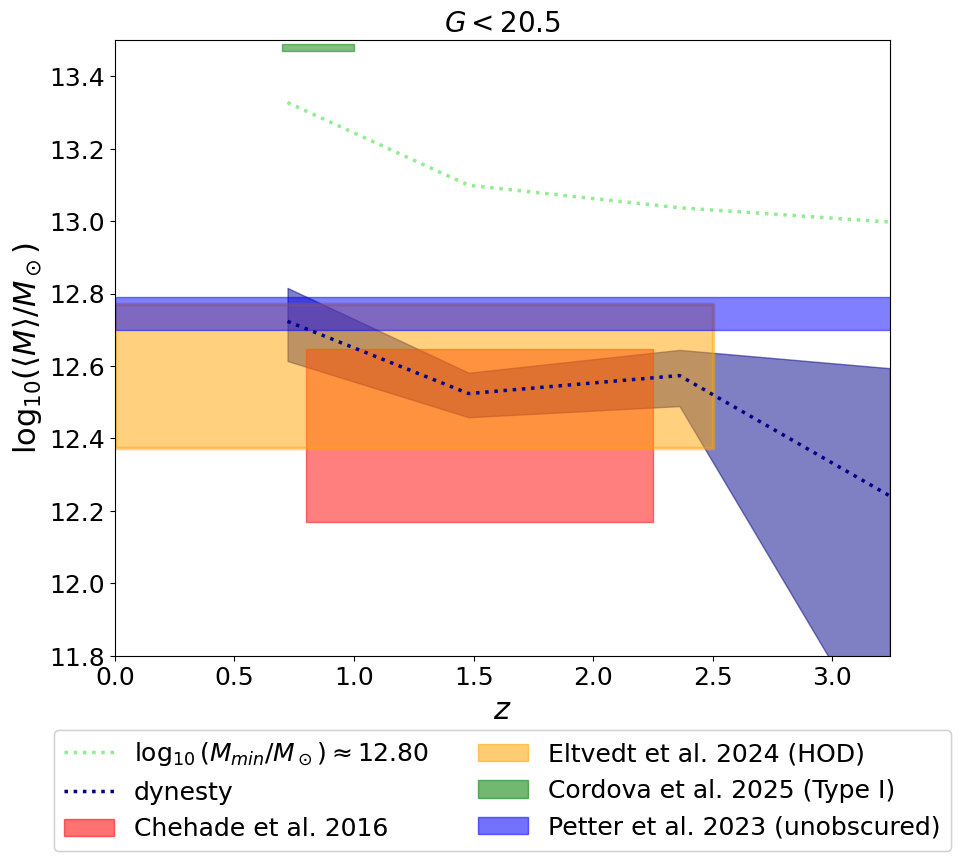

In [70]:
fig = plt.figure(figsize = (10, 8))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(1, 1, wspace = 0)
ax1 = fig.add_subplot(gs[0])
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
# plt.fill_between(zbin, [11.94]*len(zbin), [12.07]*len(zbin), alpha = 0.5, label = 'Giner Mascarell et al. 2025', color = 'lightgreen')

M_h = [M(np.logspace(M_min[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

# M_h_lo = [M(np.logspace(M_min_lo[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, 
#          recenter = False)[0] for j in z_array]
# M_h_hi = [M(np.logspace(M_min_hi[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, 
#          recenter = False)[0] for j in z_array]
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), 
                # mpatches.Patch(color='lightgreen', alpha = 0.5), 
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [#'Giner Mascarell et al. 2025', 
                                          r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.1), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

plt.show()

<>:46: SyntaxWarning: invalid escape sequence '\D'
<>:46: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_32939/1482196861.py:46: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')


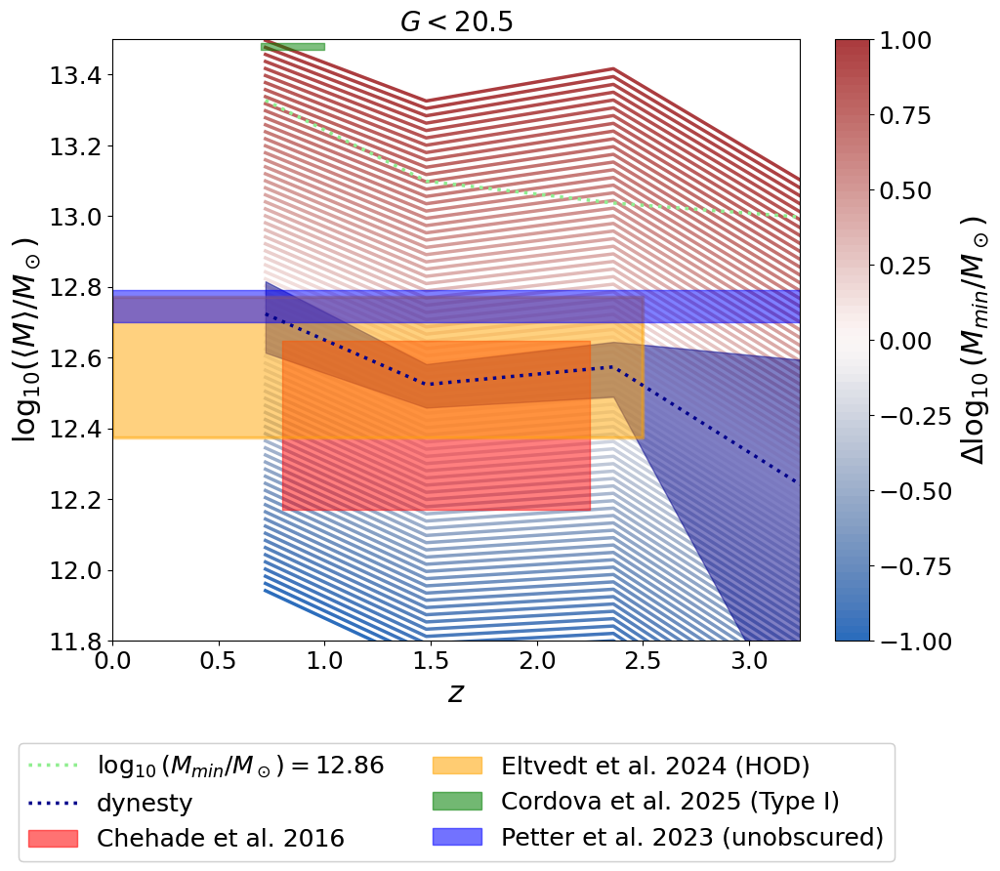

In [71]:
fig = plt.figure(figsize = (10, 8))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
ax1 = fig.add_subplot(gs[0])

for k in range(len(bins)):
    
    M_h = [M(np.logspace(M_min[j]-1+k/int(len(bins)/2), M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
    ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
             color = cmap_M_min[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h = [M(np.logspace(M_min[j], M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in range(len(z_array))]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0]), 'dynesty',
                            'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.15), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
plt.show()

In [72]:
fduty_array = np.logspace(-5,0, 51) #-4

In [73]:
cmap_fduty_k = sns.color_palette("vlag", n_colors = len(fduty_array))

In [74]:
n_q_percentile = []
for j in z_array:
    n_q_samples=[]
    for i in range(len(ind)):
        n_m=np.ones(np.shape(bins))*10**f_duty_samples[j][i]
        n_q_samples.append(M(np.logspace(M_min_samples[j][i], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[1])
    n_q_percentile.append(np.percentile(n_q_samples, [16, 84]))
n_q_theory_fit_lo, n_q_theory_fit_hi = np.array(n_q_percentile).T

<>:46: SyntaxWarning: invalid escape sequence '\D'
<>:86: SyntaxWarning: invalid escape sequence '\D'
<>:46: SyntaxWarning: invalid escape sequence '\D'
<>:86: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_32939/2488807320.py:46: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_32939/2488807320.py:86: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(f_{duty})$')


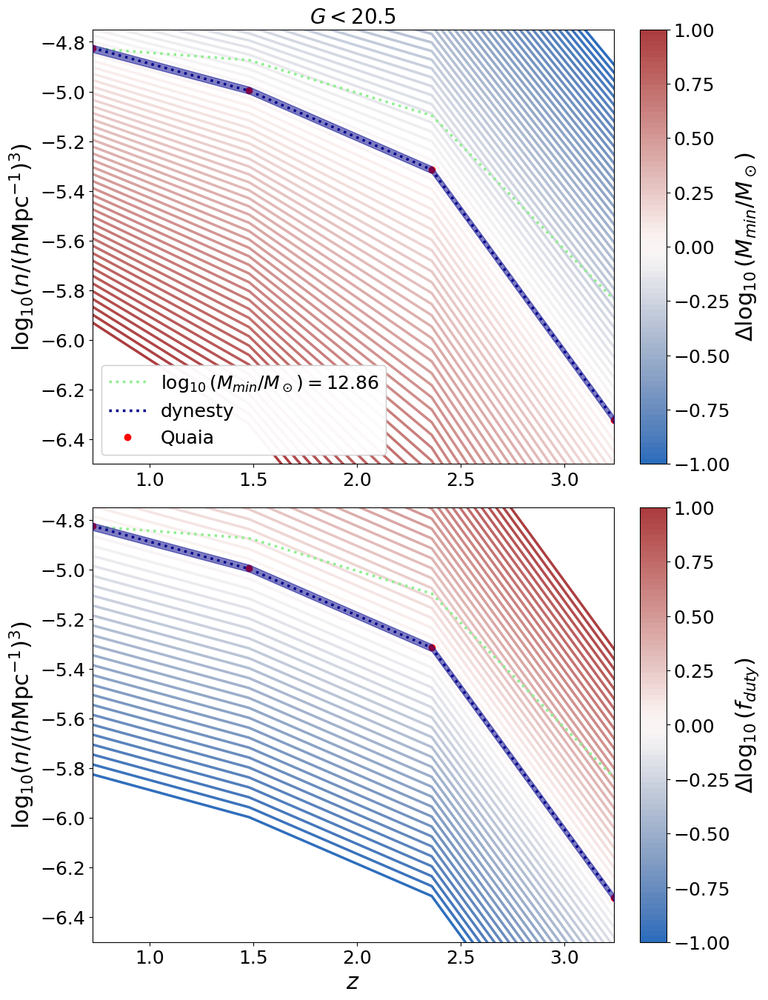

In [75]:
fig = plt.figure(figsize = (10, 16))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(2, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])
ylim = -6.5, -4.75

for k in range(len(bins)):
    
    n_q_theory = [M(np.logspace(M_min[j]-1+k/int(len(bins)/2), M_max, 79), np.ones(np.shape(bins))*10**f_duty[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:[{:.2f}-{:.2f}] M_\odot$'.format(f_duty[0]*100, f_duty[-1]*100, np.log10(bins[0]), 
                                                                                                  np.log10(bins[-1])), color = cmap_M_min[k])
    
n_q_theory, n_q_theory_fit = [], [] #, n_q_theory_fit_lo, n_q_theory_fit_hi = [], [], [], []
for j in z_array:
    
    n_q_theory.append(M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
    
    n_m=np.ones(np.shape(bins))*10**f_duty[j]
    n_q_theory_fit.append(M(np.logspace(M_min[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
    # n_q_theory_fit_lo.append(M(np.logspace(M_min_lo[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
    # n_q_theory_fit_hi.append(M(np.logspace(M_min_hi[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])

ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'$\chi^2$ minimization') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, label = r'$\chi^2$ minimization', zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_title('$G<{}$'.format(G_hi))
ax1.set_xlim(zbin[0], zbin[-1])

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5, 
                       label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5, 
                       label = 'dynesty'), 
                Line2D([0], [0], color = 'red', marker = 'o', linestyle = 'None', linewidth = 2.5, label = 'Quaia')]
second_legend = ax1.legend(handles = custom_lines)
fig.add_artist(second_legend)

# ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
# plt.show()

# fig = plt.figure(figsize = (10, 8))
# labels_cf = ['qq', r'$\xi_{2h}$']
# gs = gridspec.GridSpec(1, 3, width_ratios = [1, 0.05, 0.05], wspace = 0)
ax1 = fig.add_subplot(gs[3])
i = 1
l = 38

for k in range(len(fduty_array)):

    n_q_theory=[]
    for j in z_array:
        
        n_m = np.ones(np.shape(bins))*10**(f_duty[j]-1+k/int(len(fduty_array)/2))
        n_q_theory.append(M(np.logspace(M_min[j], M_max, 79), n_m, a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1])
        
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             color = cmap_fduty_k[k])
    
n_q_theory = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':', 
         label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])) # color = cmaps[i][j], alpha = (l+1)/len(bins)) np.log10(bins[l])

ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'dynesty') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

# ax1.set_title('$G<{}$'.format(G_hi))

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)
# ax1.legend()
ax1.set_xlim(zbin[0], zbin[-1])

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \log_{10}(f_{duty})$')
plt.show()

# Debug covariance
## Check that masking is the same

In [245]:
# Create the bins array
offset = 2.5
delta_max = 1 #64
delta_min = 1 #np.min((np.floor((30-0.15)/offset), delta_max))

rmin = 30-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax = 80+delta_max*offset # 200
nbins = 20 + int(delta_min+delta_max) #90 #20
rbins = np.linspace(rmin, rmax, nbins + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
scale = 'linear'
rbins, quaia.recenter(rbins), np.diff(quaia.recenter(rbins))

(array([27.5, 30. , 32.5, 35. , 37.5, 40. , 42.5, 45. , 47.5, 50. , 52.5,
        55. , 57.5, 60. , 62.5, 65. , 67.5, 70. , 72.5, 75. , 77.5, 80. ,
        82.5]),
 array([28.75, 31.25, 33.75, 36.25, 38.75, 41.25, 43.75, 46.25, 48.75,
        51.25, 53.75, 56.25, 58.75, 61.25, 63.75, 66.25, 68.75, 71.25,
        73.75, 76.25, 78.75, 81.25]),
 array([2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
        2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5]))

In [178]:
j = 0
C_unmasked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, rmin, rmax, nbins, j, cosmo))
C_masked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, 30, 80, 20, j, cosmo))

In [179]:
r = quaia.recenter(rbins) 
rpmask = (r >= 30) & (r  <= 80)
ix_grid = np.ix_(rpmask, rpmask)

In [180]:
np.max(C_unmasked[ix_grid]-C_masked)

1.2705494208814505e-21

(-1.0, 1.0)


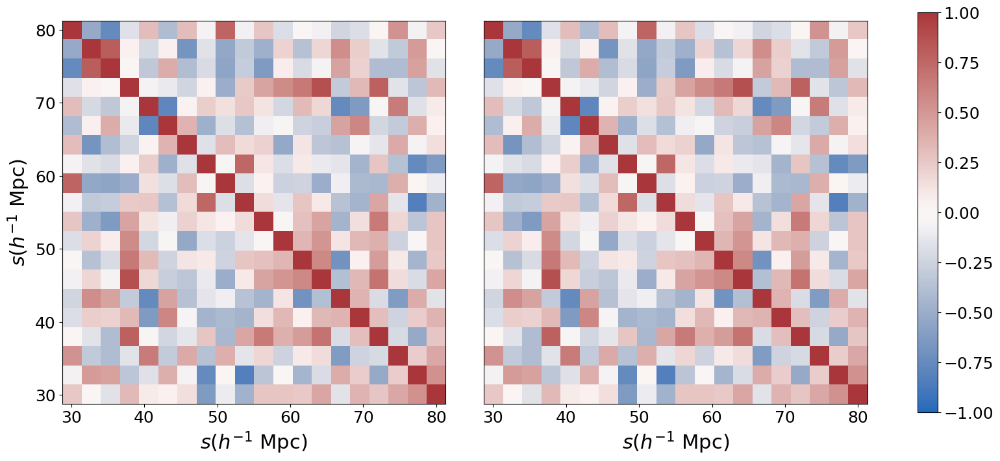

In [181]:
cmap = sns.color_palette("vlag", as_cmap=True)

# plot!
fig = plt.figure(figsize = (20, 8))
gs = gridspec.GridSpec(1, 2, wspace = 0.1, hspace = 0.1)
# axes = []
# for i in range(len(zbin_array)-1):
    
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

# C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_N{}_{}.npy'.format(G_hi, rmin, rmax, nbins, zbin_array[i], zbin_array[i+1], N, cosmo))
matrix = np.corrcoef(C_unmasked[ix_grid])
image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
matrix = np.corrcoef(C_masked)
image = ax2.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
print(image.get_clim())
# if i>1:
ax1.set_xlabel('$s (h^{-1}$ Mpc)')
ax2.set_xlabel('$s (h^{-1}$ Mpc)')
# else:
#     ax1.set_xticks([])
# if i %2 == 0:
ax1.set_ylabel('$s (h^{-1}$ Mpc)')
# else:
ax2.set_yticks([])
# ax1.set_title('${:.0f}<z \leq{:.0f}$'.format(zbin_array[i], zbin_array[i+1]))
# axes.append(ax1)
    
fig.colorbar(image, ax = [ax1, ax2])
plt.show()

## Check the $z_\mathrm{max}$ limit

In [78]:
C_unmasked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{:.1f}_N25_{}.npy'.format(G_hi, 30, 80, 20, z_bins[j], z_bins[j+1], 'cosmo_planck18'))
C_masked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, 30, 80, 20, j, cosmo))

In [79]:
np.max(C_unmasked-C_masked)

0.0

(-1.0, 1.0)


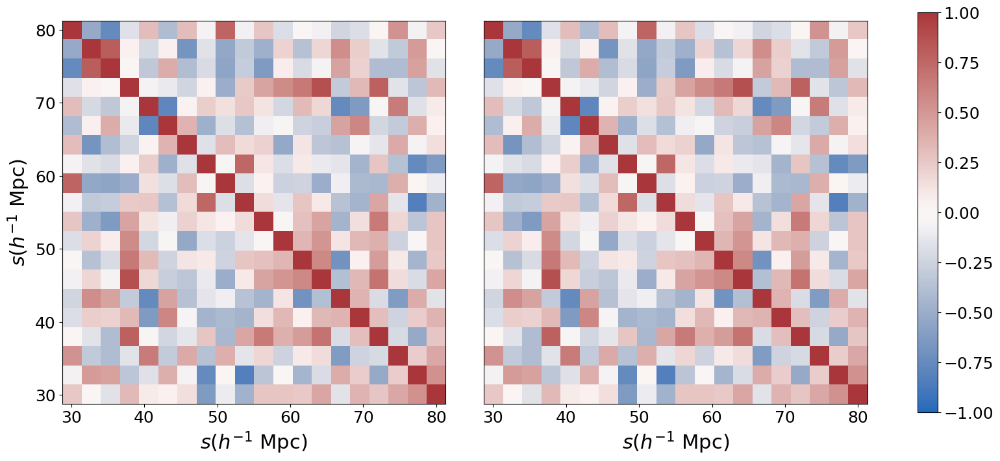

In [80]:
cmap = sns.color_palette("vlag", as_cmap=True)

# plot!
fig = plt.figure(figsize = (20, 8))
gs = gridspec.GridSpec(1, 2, wspace = 0.1, hspace = 0.1)
    
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

matrix = np.corrcoef(C_unmasked)
image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
matrix = np.corrcoef(C_masked)
image = ax2.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
print(image.get_clim())
ax1.set_xlabel('$s (h^{-1}$ Mpc)')
ax2.set_xlabel('$s (h^{-1}$ Mpc)')
ax1.set_ylabel('$s (h^{-1}$ Mpc)')
ax2.set_yticks([])
    
fig.colorbar(image, ax = [ax1, ax2])
plt.show()

## Check the cosmology

In [81]:
C_unmasked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25.npy'.format(G_hi, 30, 80, 20, j))
C_masked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, 30, 80, 20, j, cosmo))

In [82]:
np.max(C_unmasked-C_masked)

9.563796525941806e-06

(-1.0, 1.0)


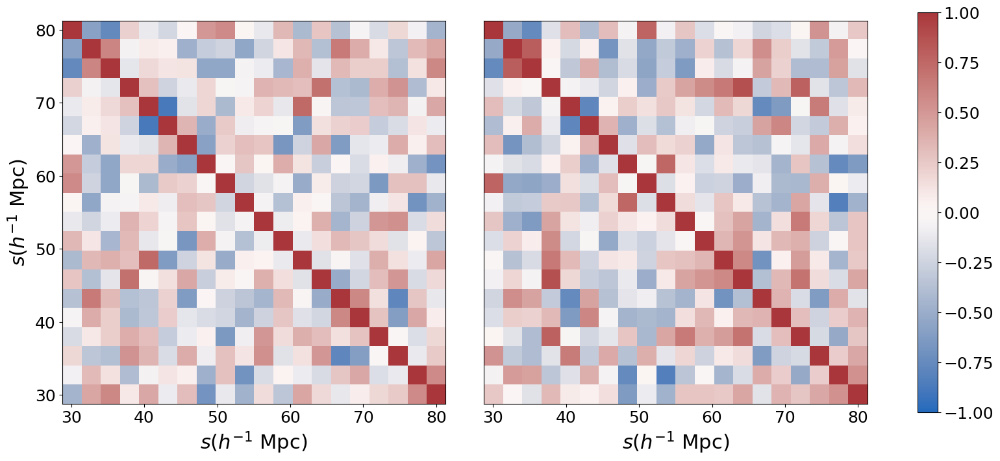

In [83]:
cmap = sns.color_palette("vlag", as_cmap=True)

# plot!
fig = plt.figure(figsize = (20, 8))
gs = gridspec.GridSpec(1, 2, wspace = 0.1, hspace = 0.1)
    
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

matrix = np.corrcoef(C_unmasked)
image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
matrix = np.corrcoef(C_masked)
image = ax2.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
print(image.get_clim())
ax1.set_xlabel('$s (h^{-1}$ Mpc)')
ax2.set_xlabel('$s (h^{-1}$ Mpc)')
ax1.set_ylabel('$s (h^{-1}$ Mpc)')
ax2.set_yticks([])
    
fig.colorbar(image, ax = [ax1, ax2])
plt.show()

### Check the number of bins

In [172]:
C_unmasked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N25_{}.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], cosmo))
C_masked = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_z{:.1f}_N25_{}.npy'.format(G_hi, 30, 80, 20, j, cosmo))

In [173]:
r = quaia.recenter(rbins_chi2) 
rpmask = (r >= 30) & (r  <= 80)
ix_grid = np.ix_(rpmask, rpmask)

In [174]:
np.max(C_unmasked[ix_grid]-C_masked)

7.551764857589067e-06

(-1.0, 1.0)


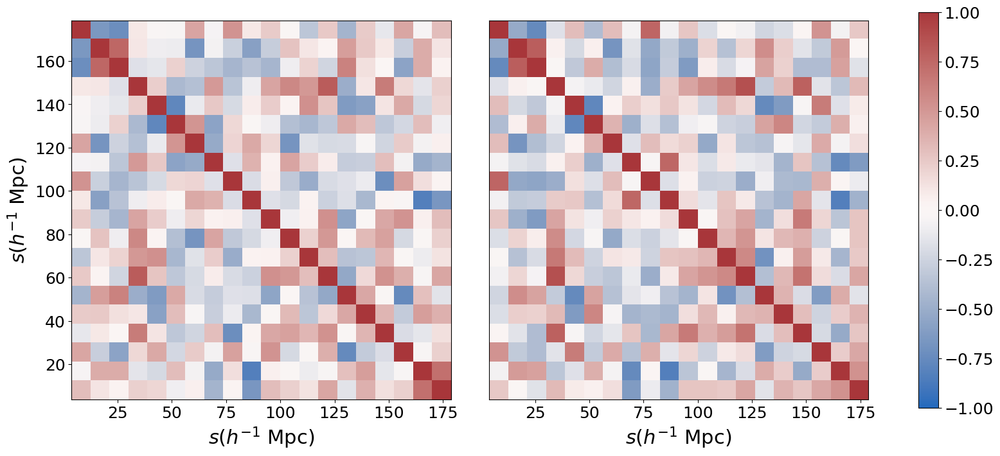

In [176]:
cmap = sns.color_palette("vlag", as_cmap=True)

# plot!
fig = plt.figure(figsize = (20, 8))
gs = gridspec.GridSpec(1, 2, wspace = 0.1, hspace = 0.1)
    
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

matrix = np.corrcoef(C_unmasked[ix_grid])
image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
matrix = np.corrcoef(C_masked)
image = ax2.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
print(image.get_clim())
ax1.set_xlabel('$s (h^{-1}$ Mpc)')
ax2.set_xlabel('$s (h^{-1}$ Mpc)')
ax1.set_ylabel('$s (h^{-1}$ Mpc)')
ax2.set_yticks([])
    
fig.colorbar(image, ax = [ax1, ax2])
plt.show()